In [10]:
from astropy.io import fits
import os
from sklearn import preprocessing
import shutil
from astropy.timeseries import LombScargle
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from scipy import optimize
from scipy.interpolate import CubicSpline
from scipy.integrate import simps
from scipy.interpolate import UnivariateSpline
from scipy.ndimage import gaussian_filter
import scipy.signal as signal
from astropy.time import Time
import pandas as pd
from lmfit import Model
from PyAstronomy.pyasl import foldAt
from scipy.optimize import curve_fit
import matplotlib.colors as colors
import matplotlib.cbook as cbook
from scipy.ndimage.filters import uniform_filter
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
from matplotlib.gridspec import GridSpec

In [48]:
def straightLine(xpoints,ypoints,inXpoints):
    gradient = (ypoints[1]-ypoints[0])/(xpoints[1]-xpoints[0])
    intercept = ypoints[0] - (gradient*xpoints[0])
    outYpoints = (inXpoints*gradient)+intercept
    return outYpoints
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def area_est(xpoints, ypoints, start, finish):
    
    startIdx = find_nearest(xpoints, start)
    finishIdx = find_nearest(xpoints, finish)
    xpoints = xpoints[startIdx:finishIdx]
    ypoints = ypoints[startIdx:finishIdx]
    areaEst = np.trapz(ypoints, x=xpoints)
    #offset = np.abs(min(ypoints))
    #ypoints = ypoints + offset
    #dx = xpoints[2]-xpoints[1]
    #areaEst = 0
    #for i in range(len(ypoints)-1):
        #areaEst = areaEst + ((ypoints[i]+ypoints[i+1])*dx/2)
    return areaEst
xpoints=np.linspace(0,4200,4200)
def median_average(array, N):
    result = []
    for i in range(0, int(np.shape(array)[0]/N)+1):
        tmparray = array[i*N:(i*N+N)]
        tmparray = np.median(tmparray,axis=0)
        if i == 0:
            result = tmparray
            
        else:
            result = np.vstack([result, tmparray])
            
    return result
def foldMeth(timeArray, period):
    phases = []
    for el in timeArray:
        passed = int(el/period)
        leftover = el - (passed*period)
        phase = leftover/period
        phases.append(phase)
    return np.array(phases)

def f(x, c, q,A, B): 
    return c*x*x*x + q*x*x + A*x + B

def f2(x, d,c, q,A, B): 
    return d*x*x*x*x + c*x*x*x + q*x*x + A*x + B
def f3(x, c, q,A): 
    return c*x*x + q*x + A

def f5(x, c, q,A,b,d,z): 
    return c*x*x*x*x*x + q*x*x*x*x + A*x*x*x + b*x*x + d*x+z

def gaus(x,a,x0,sigma,c):
    return a*np.exp(-(x-x0)**2/(2*sigma**2))-c
def gausDouble(x,a,x0,sigma,c, a2,x02,sigma2):
    return (a*np.exp(-(x-x0)**2/(2*sigma**2)))+(a2*np.exp(-(x-x02)**2/(2*sigma2**2)))-c

def wavelToVelB(wavel):
    return 299792.458*(wavel-4861.363)/4861.363
def wavelToVelR(wavel):
    return wavel
def wavelToStdB(wavel):
    return wavel
def wavelToStdR(wavel):
    return wavel

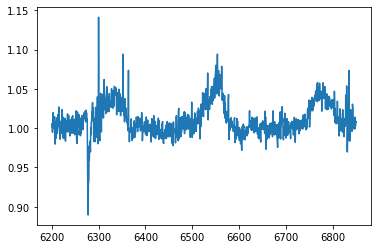

In [12]:
dataPTO = pd.read_csv('gd356_norm.dat', delimiter=",")

wavePTO = dataPTO['wave']
sensPTO = dataPTO['sens']
plt.plot(wavePTO,sensPTO)


(0.9, 1.15)

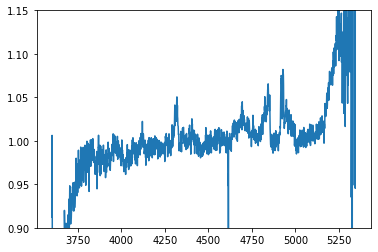

In [13]:
dataPTOB = pd.read_csv('gd356_norm_blue.dat', delimiter=",")

wavePTOB = dataPTOB['wavel']
sensPTOB = dataPTOB['flux']
plt.plot(wavePTOB,sensPTOB)
plt.ylim(0.9,1.15)

(6100, 6800)

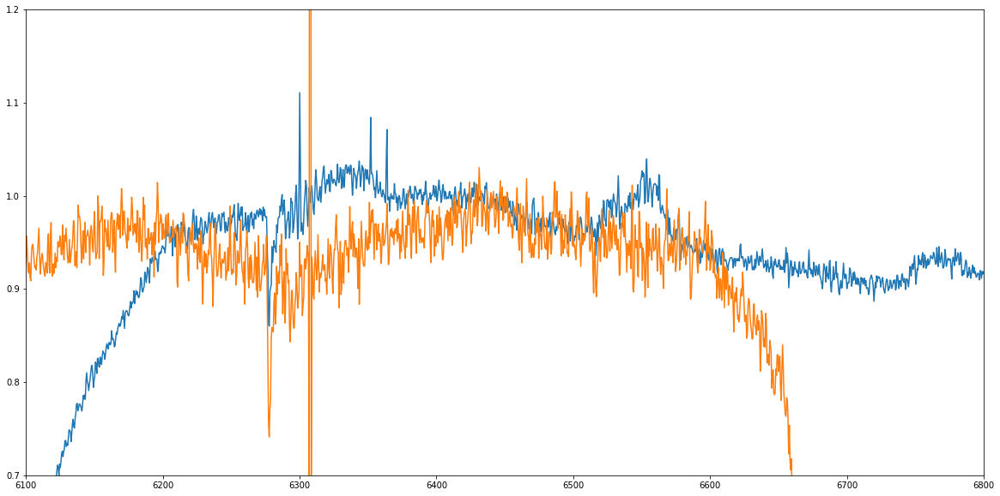

In [14]:
dataPTO = pd.read_csv('testfile.dat', delimiter=",")

wavePTO = dataPTO['wavel']
sensPTO = dataPTO['flux']
plt.figure(figsize=(20,10))
plt.plot(wavePTO,sensPTO)
RStat = np.loadtxt("WD1055.dat", usecols=(0,1,2))
wavRStat = RStat[:,0]
errRStat = RStat[:,1]
plt.plot(wavRStat, (errRStat/np.mean(errRStat))-0.35)
plt.ylim(0.7,1.2)
plt.xlim(6100,6800)

In [15]:
fff = open("timeBM", "r")
timeBM = []
for x in fff:
    x = float(x)
    timeBM.append(x)
    
fff = open("timeRM", "r")
timeRM = []
for x in fff:
    x = float(x)
    timeRM.append(x)
    
fff = open("timeBJ", "r")
timeBJ = []
for x in fff:
    x = float(x)
    timeBJ.append(x)
    
fff = open("timeRJ", "r")
timeRJ = []
for x in fff:
    x = float(x)
    timeRJ.append(x)
    
BJXpoints = np.linspace(3625, 5460, 4200)
print(BJXpoints[665:3485])

RJXpoints = np.linspace(5525, 7575, 4200)
print(RJXpoints[800:3200])

countGlob = 1
holder_arrayBM = []

path = 'C:/Users/Admin/newMay19/'
consts = []
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayBM = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayBM = np.vstack((holder_arrayBM, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
countGlob = 1
holder_arrayBJ = []

path = 'C:/Users/Admin/newJul18/'
consts = []
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayBJ = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayBJ = np.vstack((holder_arrayBJ, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
        
countGlob = 1
holder_arrayRJ = []

path = 'C:/Users/Admin/re-normedAlpha/jul/'
consts = []
with open(path+'RJohnNorm') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
  
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            #holder_arrayRJ = gaussian_filter(typeEx, sigma=1)
            holder_arrayRJ = typeEx
        else:
            
            #holder_arrayRJ = np.vstack((holder_arrayRJ, gaussian_filter(typeEx, sigma=1)))
            holder_arrayRJ = np.vstack((holder_arrayRJ, typeEx))
        countGlob = 2

countGlob = 1
holder_arrayRM = []

path = 'C:/Users/Admin/re-normedAlpha/may/'
consts = []
with open(path+'RJohnNorm') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayRM = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayRM = np.vstack((holder_arrayRM, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2

[3915.61085973 3916.04786854 3916.48487735 ... 5146.66468207 5147.10169088
 5147.53869969]
[5915.56918314 5916.05739462 5916.5456061  ... 7085.81209812 7086.3003096
 7086.78852108]


In [16]:
#individual morph
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
xp1 = xpointss[0:35]
xp2 = xpointss[125:800]
xp3 = xpointss[1100:1180]
xp4 = xpointss[1330:1440]
xp5 = xpointss[1550:2400]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)


testMean = np.zeros(len(xpointss))
for i in range(113):
    flux = holder_arrayBJ[i]
    flux = flux[:4100]
    flux = flux[1500:3800]
    tmp1 = flux[0:35]
    tmp2 = flux[125:800]
    tmp3 = flux[1100:1180]
    tmp4 = flux[1330:1440]
    tmp5 = flux[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = flux/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    for count, el in enumerate(fluxNormed):
        if el > 1.2:
            fluxNormed[count] = np.median(fluxNormed[count-100:count+100])
            
    fluxNormed = fluxNormed * f(xpointss, popt[0], popt[1], popt[2], popt[3])
    tmp1 = fluxNormed[0:35]
    tmp2 = fluxNormed[125:800]
    tmp3 = fluxNormed[1100:1180]
    tmp4 = fluxNormed[1330:1440]
    tmp5 = fluxNormed[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = fluxNormed/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    testMean = testMean + fluxNormed
    #plt.plot(xpointss[800:1600], testMean[800:1600])
    #plt.plot(xpointss[800:1600], fluxNormed[800:1600], c='k')
    #plt.show()
    if i ==0:
        #stack = fluxNormed[800:1600]
        stack = fluxNormed
    else:
        #stack = np.vstack((stack, fluxNormed[800:1600]))
        stack = np.vstack((stack, fluxNormed))
testMean = testMean /113
stackBJ = stack
testMeanBJ = testMean
#above 1.2
#0.2-0.4 full

(0.98, 1.1)

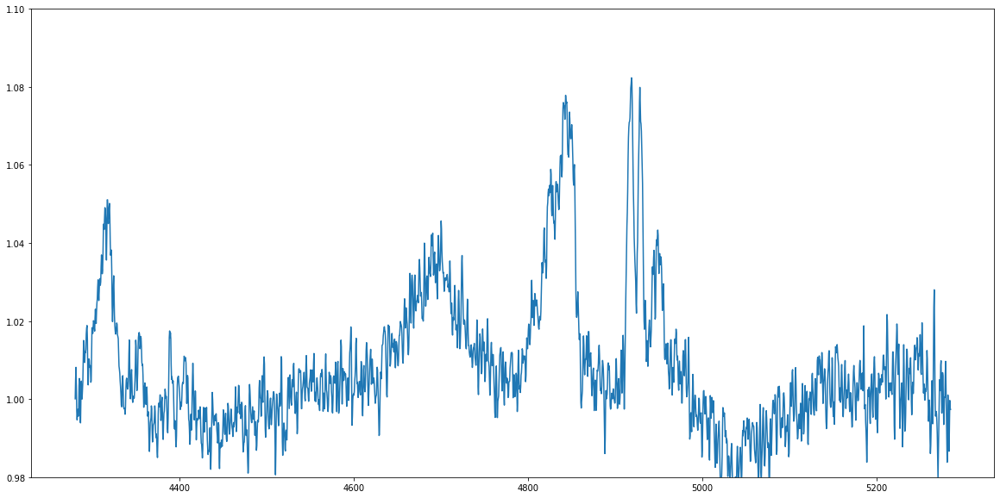

In [17]:
plt.figure(figsize=(20,10))
plt.plot(xpointss,testMean)
#plt.plot(wavePTOB,sensPTOB)
#plt.xlim(4300,5200)
plt.ylim(0.98,1.1)

In [18]:
find_nearest(xpointss,5000)

1646

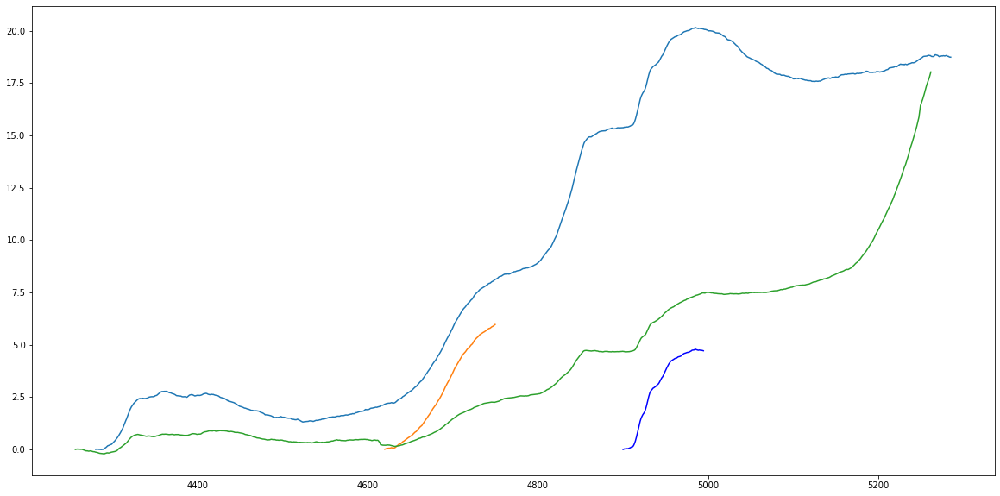

In [19]:
plt.figure(figsize=(20,10))
plt.plot(xpointss,np.cumsum(testMean-1))
plt.plot(xpointss[777:1075],np.cumsum(testMean[777:1075]-1))
plt.plot(xpointss[1418:1635],np.cumsum(testMean[1418:1635]-1), c='b')
plt.plot(wavePTOB[750:1900],np.cumsum(sensPTOB[750:1900]-1))

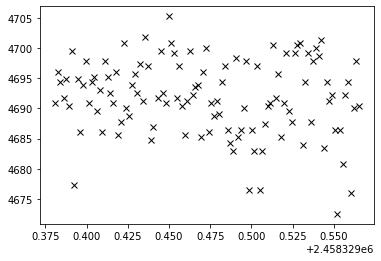

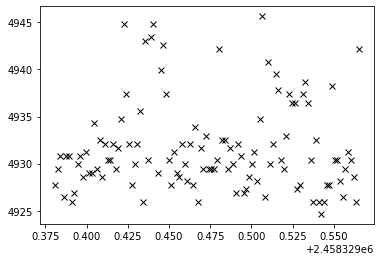

In [20]:
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
velocity = (xpointss[800:1600])


colmean = np.clip(stackBJ, 1.025,1.15).mean(axis=0)
JulBVel = velocity
JulBmean = colmean


#popt,pcov = curve_fit(gaus,JulBVel[300:600],JulBmean[300:600],p0=[0.04,4840,12,-1.03])
BJPiMean = popt[1]
BJPiErr = np.sqrt(np.diag(pcov))[1]
#popt,pcov = curve_fit(gaus,JulBVel[600:675],JulBmean[600:675],p0=[1,4920,5,1.03])
BJSPMean = popt[1]
BJSPErr = np.sqrt(np.diag(pcov))[1]
#popt,pcov = curve_fit(gaus,JulBVel[675:775],JulBmean[675:775],p0=[0.05,4930,2,-1.03])
BJSPPMean = popt[1]
BJSPPErr = np.sqrt(np.diag(pcov))[1]
#popt,pcov = curve_fit(gaus,JulBVel[700:],JulBmean[700:],p0=[0.05,4960,5,-1.03], bounds=([0,4940,2,-1.1],[1.5,4960,10,-0.95]))
BJSPPPMean = popt[1]
BJSPPPErr = np.sqrt(np.diag(pcov))[1]
#popt,pcov = curve_fit(gaus,JulBVel[:300],JulBmean[:300],p0=[0.05,4693,20,-1.03])
BJSMMean = popt[1]
BJSMErr = np.sqrt(np.diag(pcov))[1]

BJGaussMEansM = []
BJGaussMEansMErr = []
BJGaussMEansMSP = []
BJGaussMEansMErrSP = []
BJGaussMEansMSPP = []
BJGaussMEansMErrSPP = []
BJGaussMEansMSPPP = []
BJGaussMEansMErrSPPP = []
BJGaussMEansMSM = []
BJGaussMEansMErrSM = []
miniCount = 0
timeBJ = np.array(timeBJ)
sigmaMinusCent = []
sigmaPlusCent = []
for i in range(113):
    thisflux = stackBJ[i]

    
        
    maxwavel = xpointss[777:1075][find_nearest(np.cumsum(thisflux[777:1075]-1)/max(np.cumsum(thisflux[777:1075]-1)),0.5)]
    sigmaMinusCent.append(maxwavel)
    
    
    maxwavel = xpointss[1418:1635][find_nearest(np.cumsum(thisflux[1418:1635]-1)/max(np.cumsum(thisflux[1418:1635]-1)),0.5)]
    sigmaPlusCent.append(maxwavel)
plt.plot(timeBJ,sigmaMinusCent, 'kx')
plt.show()
plt.plot(timeBJ,sigmaPlusCent, 'kx')

In [21]:
#individual morph
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
xp1 = xpointss[0:35]
xp2 = xpointss[125:800]
xp3 = xpointss[1100:1180]
xp4 = xpointss[1330:1440]
xp5 = xpointss[1550:2400]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
testMean = np.zeros(len(xpointss))

for i in range(120):
    flux = holder_arrayBM[i]
    flux = flux[:4100]
    flux = flux[1500:3800]
    tmp1 = flux[0:35]
    tmp2 = flux[125:800]
    tmp3 = flux[1100:1180]
    tmp4 = flux[1330:1440]
    
    
    tmp5 = flux[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = flux/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    for count, el in enumerate(fluxNormed):
        if el > 1.2:
            fluxNormed[count] = np.median(fluxNormed[count-25:count+100])
            
    fluxNormed = fluxNormed * f(xpointss, popt[0], popt[1], popt[2], popt[3])
    tmp1 = fluxNormed[0:35]
    tmp2 = fluxNormed[125:800]
    tmp3 = fluxNormed[1100:1180]
    tmp4 = fluxNormed[1330:1440]
    tmp5 = fluxNormed[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = fluxNormed/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    testMean = testMean + fluxNormed
    if i ==0:
        stack = fluxNormed
    else:
        stack = np.vstack((stack, fluxNormed))
testMean = testMean /120 
stackBM = stack
testMeanBM = testMean
#above 1.2
#0.2-0.4 full

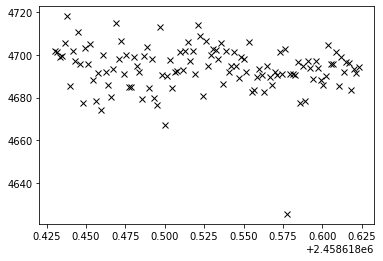

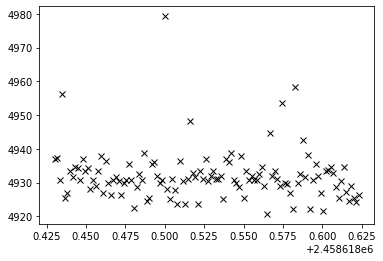

In [22]:
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
velocity = (xpointss[800:1600])


timeBM = np.array(timeBM)
sigmaMinusCentM = []
sigmaPlusCentM = []
for i in range(120):
    thisflux = stackBM[i]

    
        
    maxwavel = xpointss[777:1075][find_nearest(np.cumsum(thisflux[777:1075]-1)/max(np.cumsum(thisflux[777:1075]-1)),0.5)]
    sigmaMinusCentM.append(maxwavel)
    
    
    maxwavel = xpointss[1418:1635][find_nearest(np.cumsum(thisflux[1418:1635]-1)/max(np.cumsum(thisflux[1418:1635]-1)),0.5)]
    sigmaPlusCentM.append(maxwavel)
plt.plot(timeBM,sigmaMinusCentM, 'kx')
plt.show()
plt.plot(timeBM,sigmaPlusCentM, 'kx')

In [23]:
fff = open("timeBM", "r")
timeBM = []
for x in fff:
    x = float(x)
    timeBM.append(x)
    
fff = open("timeRM", "r")
timeRM = []
for x in fff:
    x = float(x)
    timeRM.append(x)
    
fff = open("timeBJ", "r")
timeBJ = []
for x in fff:
    x = float(x)
    timeBJ.append(x)
    
fff = open("timeRJ", "r")
timeRJ = []
for x in fff:
    x = float(x)
    timeRJ.append(x)
    
BJXpoints = np.linspace(3625, 5460, 4200)
print(BJXpoints[665:3485])

RJXpoints = np.linspace(5525, 7575, 4200)
print(RJXpoints[800:3200])

countGlob = 1
holder_arrayBM = []

path = 'C:/Users/Admin/newMay19/'
consts = []
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayBM = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayBM = np.vstack((holder_arrayBM, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
countGlob = 1
holder_arrayBJ = []

path = 'C:/Users/Admin/newJul18/'
consts = []
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayBJ = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayBJ = np.vstack((holder_arrayBJ, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
        
countGlob = 1
holder_arrayRJ = []

path = 'C:/Users/Admin/newJul18/'
consts = []
with open(path+'RTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
  
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayRJ = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayRJ = np.vstack((holder_arrayRJ, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2

countGlob = 1
holder_arrayRM = []

path = 'C:/Users/Admin/newMay19/'
consts = []
with open(path+'RTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayRM = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayRM = np.vstack((holder_arrayRM, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2

[3915.61085973 3916.04786854 3916.48487735 ... 5146.66468207 5147.10169088
 5147.53869969]
[5915.56918314 5916.05739462 5916.5456061  ... 7085.81209812 7086.3003096
 7086.78852108]


In [24]:
#individual morph
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
xp1 = xpointss[0:35]
xp2 = xpointss[125:800]
xp3 = xpointss[1100:1180]
xp4 = xpointss[1330:1440]
xp5 = xpointss[1550:2400]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)


testMean = np.zeros(len(xpointss))
for i in range(113):
    flux = holder_arrayBJ[i]
    flux = flux[:4100]
    flux = flux[1500:3800]
    tmp1 = flux[0:35]
    tmp2 = flux[125:800]
    tmp3 = flux[1100:1180]
    tmp4 = flux[1330:1440]
    tmp5 = flux[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = flux/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    for count, el in enumerate(fluxNormed):
        if el > 1.2:
            fluxNormed[count] = np.median(fluxNormed[count-100:count+100])
            
    fluxNormed = fluxNormed * f(xpointss, popt[0], popt[1], popt[2], popt[3])
    tmp1 = fluxNormed[0:35]
    tmp2 = fluxNormed[125:800]
    tmp3 = fluxNormed[1100:1180]
    tmp4 = fluxNormed[1330:1440]
    tmp5 = fluxNormed[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = fluxNormed/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    testMean = testMean + fluxNormed
    #plt.plot(xpointss[800:1600], testMean[800:1600])
    #plt.plot(xpointss[800:1600], fluxNormed[800:1600], c='k')
    #plt.show()
    if i ==0:
        stack = fluxNormed[800:1600]
    else:
        stack = np.vstack((stack, fluxNormed[800:1600]))
testMean = testMean /113
stackBJ = stack
testMeanBJ = testMean
#above 1.2
#0.2-0.4 full

D:\conda\lib\site-packages\scipy\optimize\minpack.py:795: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


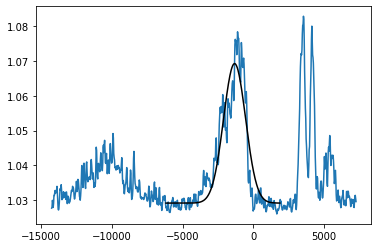

In [25]:
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
velocityBJ = velocity
colmean = np.clip(stackBJ, 1.025,1.15).mean(axis=0)
plt.plot(velocity,colmean)
JulBVel = velocity
JulBmean = colmean


popt,pcov = curve_fit(gausDouble,JulBVel[300:600],JulBmean[300:600],p0=[0.03,wavelToVelB(4825),wavelToStdB(3),0.05,wavelToVelB(4840),wavelToStdB(5),-1.03])
plt.plot(JulBVel[300:600],gausDouble(JulBVel[300:600],*popt),c='k')
plt.show()


D:\conda\lib\site-packages\ipykernel_launcher.py:149: RuntimeWarning: invalid value encountered in sqrt
D:\conda\lib\site-packages\scipy\optimize\minpack.py:795: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


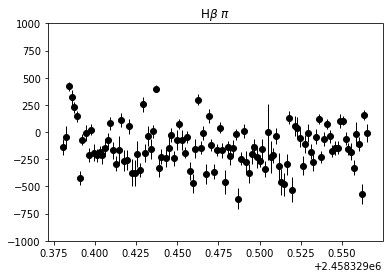

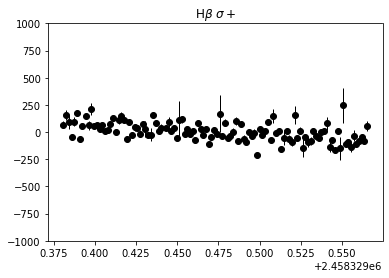

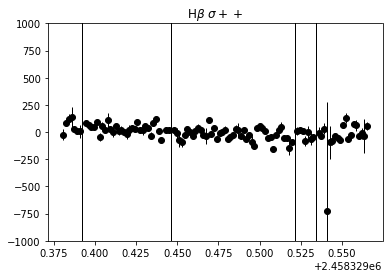

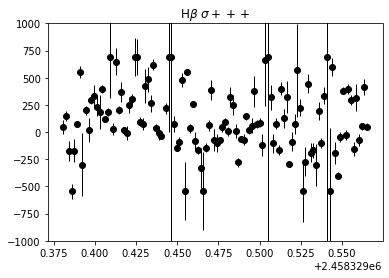

(-1000, 1000)

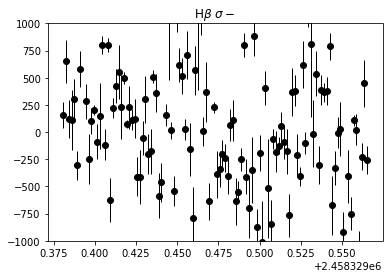

In [26]:
def straightLine(xpoints,ypoints,inXpoints):
    gradient = (ypoints[1]-ypoints[0])/(xpoints[1]-xpoints[0])
    intercept = ypoints[0] - (gradient*xpoints[0])
    outYpoints = (inXpoints*gradient)+intercept
    return outYpoints
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def area_est(xpoints, ypoints, start, finish):
    
    startIdx = find_nearest(xpoints, start)
    finishIdx = find_nearest(xpoints, finish)
    xpoints = xpoints[startIdx:finishIdx]
    ypoints = ypoints[startIdx:finishIdx]
    areaEst = np.trapz(ypoints, x=xpoints)
    #offset = np.abs(min(ypoints))
    #ypoints = ypoints + offset
    #dx = xpoints[2]-xpoints[1]
    #areaEst = 0
    #for i in range(len(ypoints)-1):
        #areaEst = areaEst + ((ypoints[i]+ypoints[i+1])*dx/2)
    return areaEst
xpoints=np.linspace(0,4200,4200)
def median_average(array, N):
    result = []
    for i in range(0, int(np.shape(array)[0]/N)+1):
        tmparray = array[i*N:(i*N+N)]
        tmparray = np.median(tmparray,axis=0)
        if i == 0:
            result = tmparray
            
        else:
            result = np.vstack([result, tmparray])
            
    return result
def foldMeth(timeArray, period):
    phases = []
    for el in timeArray:
        passed = int(el/period)
        leftover = el - (passed*period)
        phase = leftover/period
        phases.append(phase)
    return np.array(phases)

def f(x, c, q,A, B): 
    return c*x*x*x + q*x*x + A*x + B

def f2(x, d,c, q,A, B): 
    return d*x*x*x*x + c*x*x*x + q*x*x + A*x + B
def f3(x, c, q,A): 
    return c*x*x + q*x + A

def f5(x, c, q,A,b,d,z): 
    return c*x*x*x*x*x + q*x*x*x*x + A*x*x*x + b*x*x + d*x+z

def gaus(x,a,x0,sigma,c):
    return a*np.exp(-(x-x0)**2/(2*sigma**2))-c
def gausDouble(x,a,x0,sigma,c, a2,x02,sigma2):
    return (a*np.exp(-(x-x0)**2/(2*sigma**2)))+(a2*np.exp(-(x-x02)**2/(2*sigma2**2)))-c

def wavelToVelB(wavel):
    return 299792.458*(wavel-4861.363)/4861.363
def wavelToVelR(wavel):
    return 299792.458*(wavel-6562.801)/6562.801
def wavelToStdB(wavel):
    return (wavel/0.437)*27
def wavelToStdR(wavel):
    return (wavel/0.488)*22

BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
popt,pcov = curve_fit(gaus,JulBVel[300:600],JulBmean[300:600],p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
BJPiMean = popt[1]
BJPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[600:675],JulBmean[600:675],p0=[1,wavelToVelB(4920),wavelToStdB(5),1.03])
BJSPMean = popt[1]
BJSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[675:775],JulBmean[675:775],p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03])
BJSPPMean = popt[1]
BJSPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[700:],JulBmean[700:],p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
BJSPPPMean = popt[1]
BJSPPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[:300],JulBmean[:300],p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03])
BJSMMean = popt[1]
BJSMErr = np.sqrt(np.diag(pcov))[1]

BJGaussMEansM = []
BJGaussMEansMErr = []
BJGaussMEansMSP = []
BJGaussMEansMErrSP = []
BJGaussMEansMSPP = []
BJGaussMEansMErrSPP = []
BJGaussMEansMSPPP = []
BJGaussMEansMErrSPPP = []
BJGaussMEansMSM = []
BJGaussMEansMErrSM = []
miniCount = 0
timeBJ = np.array(timeBJ)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(75)
fluxstackSPP = np.zeros(100)
fluxstackSPPP = np.zeros(100)
fluxstackSM = np.zeros(300)
for i in range(113):
    thisflux = stackBJ[i]
    piComp = thisflux[300:600]
    SPComp = thisflux[600:675]
    SPPComp = thisflux[675:775]
    SPPPComp = thisflux[700:]
    SMComp = thisflux[:300]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1100:1400]),fluxstack,p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
        BJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1400:1475]),fluxstackSP,p0=[1,wavelToVelB(4920),wavelToStdB(5),1.03])
        BJGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSP.append(thisstd)
        
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPP = fluxstackSPP / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1475:1575]),fluxstackSPP,p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03], maxfev=10000)
        BJGaussMEansMSPP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSPP.append(thisstd)
        
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSPPP = fluxstackSPPP / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1500:1600]),fluxstackSPPP,p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
        BJGaussMEansMSPPP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSPPP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[800:1100]),fluxstackSM,p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03])
        BJGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSM.append(thisstd)
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(75)
        fluxstackSPP = np.zeros(100)
        fluxstackSPPP = np.zeros(100)
        fluxstackSM = np.zeros(300)
    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1
plt.title(r"H$\beta$ $\pi$")
plt.errorbar(timeBJ,BJGaussMEansM-BJPiMean,yerr=BJGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '') 
plt.ylim(-1000,1000)
plt.show()
plt.title(r"H$\beta$ $\sigma+$")
plt.errorbar(timeBJ,BJGaussMEansMSP-BJSPMean,yerr=BJGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.ylim(-1000,1000)
plt.show()
plt.title(r"H$\beta$ $\sigma++$")
plt.errorbar(timeBJ,BJGaussMEansMSPP-BJSPPMean,yerr=BJGaussMEansMErrSPP,c='k', lw=1, marker='o',ecolor='k', ls = '' )
plt.ylim(-1000,1000)
plt.show()
plt.title(r"H$\beta$ $\sigma+++$")
plt.errorbar(timeBJ,BJGaussMEansMSPPP-BJSPPPMean,yerr=BJGaussMEansMErrSPPP,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.ylim(-1000,1000)
plt.show()
plt.title(r"H$\beta$ $\sigma-$")
plt.errorbar(timeBJ,BJGaussMEansMSM-BJSMMean,yerr=BJGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.ylim(-1000,1000)

In [27]:
#individual morph
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
xp1 = xpointss[0:35]
xp2 = xpointss[125:800]
xp3 = xpointss[1100:1180]
xp4 = xpointss[1330:1440]
xp5 = xpointss[1550:2400]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
testMean = np.zeros(len(xpointss))

for i in range(120):
    flux = holder_arrayBM[i]
    flux = flux[:4100]
    flux = flux[1500:3800]
    tmp1 = flux[0:35]
    tmp2 = flux[125:800]
    tmp3 = flux[1100:1180]
    tmp4 = flux[1330:1440]
    
    
    tmp5 = flux[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = flux/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    for count, el in enumerate(fluxNormed):
        if el > 1.2:
            fluxNormed[count] = np.median(fluxNormed[count-25:count+100])
            
    fluxNormed = fluxNormed * f(xpointss, popt[0], popt[1], popt[2], popt[3])
    tmp1 = fluxNormed[0:35]
    tmp2 = fluxNormed[125:800]
    tmp3 = fluxNormed[1100:1180]
    tmp4 = fluxNormed[1330:1440]
    tmp5 = fluxNormed[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = fluxNormed/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    testMean = testMean + fluxNormed
    if i ==0:
        stack = fluxNormed[800:1600]
    else:
        stack = np.vstack((stack, fluxNormed[800:1600]))
testMean = testMean /120 
stackBM = stack
testMeanBM = testMean
#above 1.2
#0.2-0.4 full

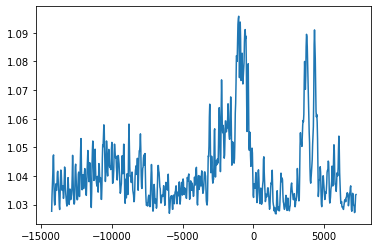

In [28]:
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
velocityBM = velocity
colmean = np.clip(stackBM, 1.025,1.15).mean(axis=0)
plt.plot(velocity,colmean)
MayBVel = velocity
MayBmean = colmean

D:\conda\lib\site-packages\scipy\optimize\minpack.py:795: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


pass
pass
pass


D:\conda\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in sqrt
D:\conda\lib\site-packages\ipykernel_launcher.py:58: RuntimeWarning: invalid value encountered in sqrt
D:\conda\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in sqrt


pass


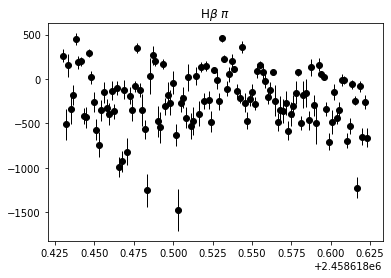

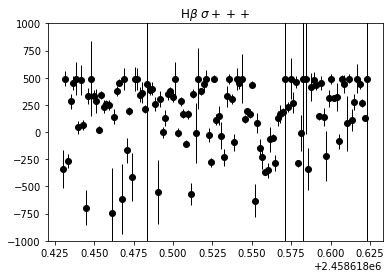

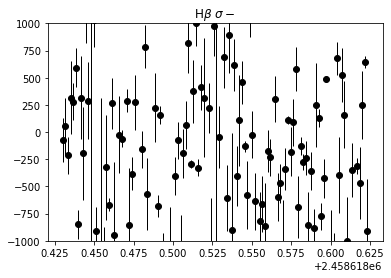

In [29]:
BMXpoints = np.linspace(3625, 5460, 4200)
BMXpoints = BMXpoints[:4100]
xpointss = BMXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
popt,pcov = curve_fit(gaus,MayBVel[300:600],MayBmean[300:600],p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
BMPiMean = popt[1]
BMPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[600:680],MayBmean[600:680],p0=[1,wavelToVelB(4920),wavelToStdB(5),-1])
BMSPMean = popt[1]
BMSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[675:775],MayBmean[675:775],p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03])
BMSPPMean = popt[1]
BMSPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[700:],MayBmean[700:],p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
BMSPPPMean = popt[1]
BMSPPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[:300],MayBmean[:300],p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03],bounds=([0,wavelToVelB(4640),wavelToStdB(20),-1.1],[0.1,wavelToVelB(4720),wavelToStdB(40),-0.95]))
BMSMMean = popt[1]
BMSMErr = np.sqrt(np.diag(pcov))[1]

BMGaussMEansM = []
BMGaussMEansMErr = []
BMGaussMEansMSP = []
BMGaussMEansMErrSP = []
BMGaussMEansMSPP = []
BMGaussMEansMErrSPP = []
BMGaussMEansMSPPP = []
BMGaussMEansMErrSPPP = []
BMGaussMEansMSM = []
BMGaussMEansMErrSM = []
miniCount = 0
timeBM = np.array(timeBM)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(80)
fluxstackSPP = np.zeros(100)
fluxstackSPPP = np.zeros(100)
fluxstackSM = np.zeros(300)
for i in range(120):
    thisflux = stackBM[i]
    piComp = thisflux[300:600]
    SPComp = thisflux[600:680]
    SPPComp = thisflux[675:775]
    SPPPComp = thisflux[700:]
    SMComp = thisflux[:300]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1100:1400]),fluxstack,p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
        BMGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / 1
        try:
            popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1400:1480]),fluxstackSP,p0=[1,wavelToVelB(4920),wavelToStdB(5),1.03],maxfev=10000)
            BMGaussMEansMSP.append(popt[1])
            thisstd = np.sqrt(np.diag(pcov))[1]
            BMGaussMEansMErrSP.append(thisstd)
        except RuntimeError:
            print('pass')
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPP = fluxstackSPP / 1
        try:
            popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1475:1575]),fluxstackSPP,p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03],maxfev=10000)
            BMGaussMEansMSPP.append(popt[1])
            thisstd = np.sqrt(np.diag(pcov))[1]
            BMGaussMEansMErrSPP.append(thisstd)
        except RuntimeError:
            print('pass')
        
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSPPP = fluxstackSPPP / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1500:1600]),fluxstackSPPP,p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
        BMGaussMEansMSPPP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErrSPPP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[800:1100]),fluxstackSM,p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03])
        BMGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErrSM.append(thisstd)
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(80)
        fluxstackSPP = np.zeros(100)
        fluxstackSPPP = np.zeros(100)
        fluxstackSM = np.zeros(300)
    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1


plt.errorbar(timeBM,BMGaussMEansM-BMPiMean,yerr=BMGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\beta$ $\pi$")
plt.show()
#plt.errorbar(timeBM,BMGaussMEansMSP-BMSPMean,yerr=BMGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k', ls = '' )
#plt.title(r"H$\beta$ $\sigma+$")
#plt.show()
#plt.errorbar(timeBM,BMGaussMEansMSPP-BMSPPMean,yerr=BMGaussMEansMErrSPP,c='k', lw=1, marker='o',ecolor='k', ls = '')
#plt.title(r"H$\beta$ $\sigma++$")
#plt.show()
plt.errorbar(timeBM,BMGaussMEansMSPPP-BMSPPPMean,yerr=BMGaussMEansMErrSPPP,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\beta$ $\sigma+++$")
plt.ylim(-1000,1000)
plt.show()
plt.errorbar(timeBM,BMGaussMEansMSM-BMSMMean,yerr=BMGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\beta$ $\sigma-$")
plt.ylim(-1000,1000)
plt.show()



(10, 12)

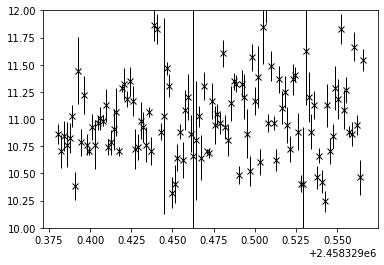

In [30]:
#plt.plot(timeBJ, (np.array(sigmaPlusCent)-np.array(sigmaMinusCent))/21.8, 'kx')
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
BJGaussMEansMErrSM = np.array(BJGaussMEansMErrSM)
BJGaussMEansMErrSP = np.array(BJGaussMEansMErrSP)
BJGaussMEansMErrSM = (BJGaussMEansMErrSM*4861.363/299792.458)
BJGaussMEansMErrSP = (BJGaussMEansMErrSP*4861.363/299792.458)

BJErrComb = np.sqrt((np.array(BJGaussMEansMErrSM)**2)+(np.array(BJGaussMEansMErrSP)**2))
BJBEst = (np.array(sigmaPlusCent)-np.array(sigmaMinusCent))/21.8
BJErrComb = BJBEst*BJErrComb/(np.array(sigmaPlusCent)-np.array(sigmaMinusCent))
plt.errorbar(timeBJ,BJBEst,yerr=BJErrComb,c='k', lw=1, marker='x',ecolor='k', ls = '')
plt.ylim(10,12)
#39.98

In [61]:
np.save('BJBEst.npy', BJBEst)
np.save('BJBEste.npy', BJErrComb)

(10, 12)

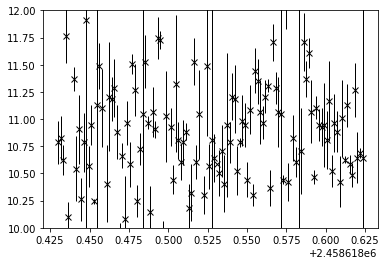

In [31]:
#plt.plot(timeBJ, (np.array(sigmaPlusCent)-np.array(sigmaMinusCent))/21.8, 'kx')
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
BMGaussMEansMErrSM = np.array(BMGaussMEansMErrSM)
BMGaussMEansMErrSP = np.array(BMGaussMEansMErrSPPP)
BMGaussMEansMErrSM = (BMGaussMEansMErrSM*4861.363/299792.458)
BMGaussMEansMErrSP = (BMGaussMEansMErrSP*4861.363/299792.458)

BMErrComb = np.sqrt((np.array(BMGaussMEansMErrSM)**2)+(np.array(BMGaussMEansMErrSP)**2))
BMBEst = (np.array(sigmaPlusCentM)-np.array(sigmaMinusCentM))/21.8
BMErrComb = BMBEst*BMErrComb/(np.array(sigmaPlusCentM)-np.array(sigmaMinusCentM))
plt.errorbar(timeBM,BMBEst,yerr=BMErrComb,c='k', lw=1, marker='x',ecolor='k', ls = '')
plt.ylim(10,12)
#39.98

In [98]:
np.save('BMBEst.npy', BMBEst)
np.save('BMBEste.npy', BMErrComb)

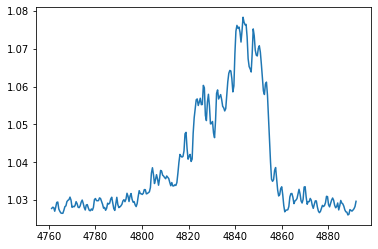

In [20]:
plt.plot(JulBVel[300:600],JulBmean[300:600])

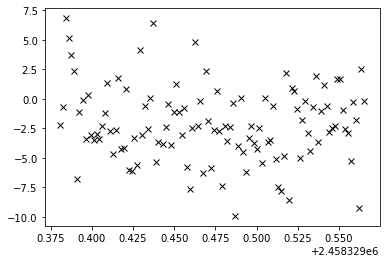

In [27]:
plt.plot(timeBJ,BJGaussMEansM-BJPiMean, 'kx')

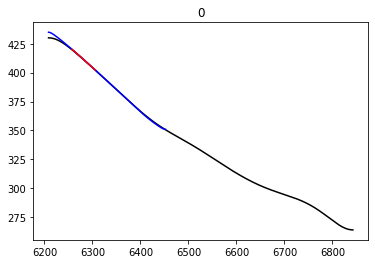

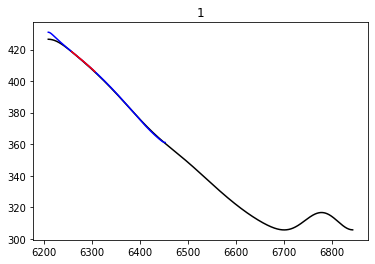

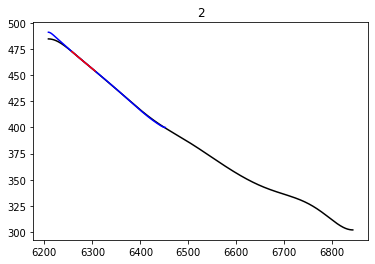

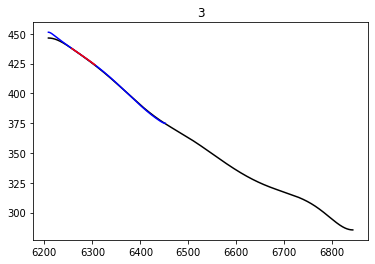

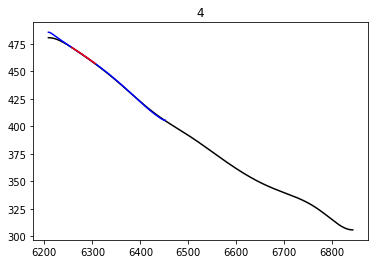

...

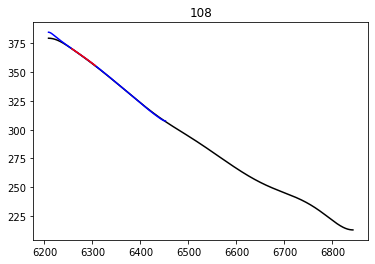

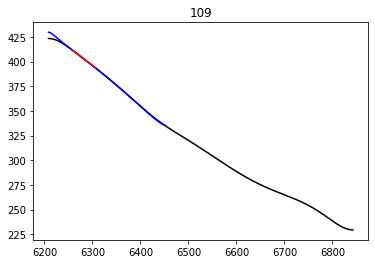

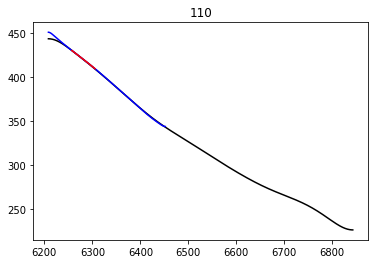

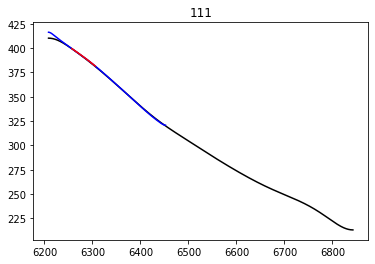

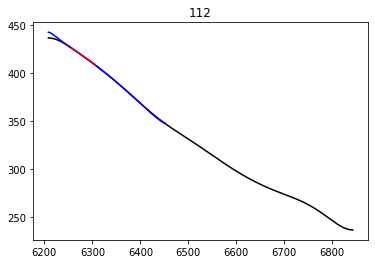

In [37]:
RJXpoints = np.linspace(5525, 7575, 4200)
RJXpoints = RJXpoints[:4100]
xpointss = RJXpoints[800:3350]

testMean = np.zeros(len(xpointss))
sigMinEst = []
xp1 = xpointss[:720]
xp2 = xpointss[1050:1225]
xp3 = xpointss[1400:1650]
xp4 = xpointss[1900:1940]
xp5 = xpointss[2400:2550]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
for i in range(113):
    flux = holder_arrayRJ[i]
    if i ==11:
        flux[2725:2745] = np.median(flux[2700:2725])
    if i ==99:
        flux[1580:1600] = np.clip(flux[1580:1600],0,500)
    if i ==111:
        flux[2250:2300] = np.clip(flux[2250:2300], 0,270)
    if i == 43:
        flux[1900:2100] = np.clip(flux[1900:2100], 0,500)
    if i == 109:
        flux[1100:1200] = np.clip(flux[1100:1200],0,500)
    if i ==42:
        flux[2695:2735] = np.clip(flux[2695:2735],0, 400)
    if i == 18:
        flux[2000:3350] = np.clip(flux[2000:3350],0, 500)
    if i ==105:
        flux[2200:2220] = np.clip(flux[2200:2220], 0,350)
    flux = flux[:4100]
    flux = flux[800:3350]

    if i ==44:
        for c, el1 in enumerate(flux[1000:1150]):
            flux[1000+c] = ((1-c/150)*np.median(flux[950:1000])+(c/150)*np.median(flux[1150:1200]))
    
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = flux#/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for count, el in enumerate(fluxNormed):
        if el > 1.15:
            fluxNormed[count] = uniform_filter(fluxNormed,size=200)[count]
        
    fluxNormed = fluxNormed #* f2(xpointss, popt[0], popt[1], popt[2], popt[3],popt[4])
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = fluxNormed#/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for c,el in enumerate(fluxNormed[700:800]):
        if el < 1:
            #print(c)
            #break
            pass
            #fluxNormed[c] = 1.1
    testMean = testMean + fluxNormed
    plt.title(str(i))
    plt.plot(xpointss[600:1900], gaussian_filter(fluxNormed[600:1900],sigma=50), c='k')
    plt.plot(xpointss[600:1100], gaussian_filter(fluxNormed[600:1100],sigma=10), c='b')
    wavelsInt = xpointss[600:1000]
    maxwavel = wavelsInt[np.argmax(gaussian_filter(fluxNormed[600:1100],sigma=50))]
    sigMinEst.append(maxwavel)
    plt.plot(xpointss[700:800], fluxNormed[700:800], c='r')
    #plt.plot(xpointss[1600:1900], testMean[1600:1900], c='r')
    plt.show()
    if i ==0:
        stack = fluxNormed[600:1900]
    else:
        stack = np.vstack((stack, fluxNormed[600:1900]))
testMean = testMean/113   
stackRJ = stack

#18

In [9]:
sigMinEst

[6340.801381281257,
 6342.754227196951,
 6357.400571564658,
 6357.400571564658,
 6335.431055013099,
 6338.36032388664,
 6344.707073112646,
 6348.124553465111,
 6330.060728744939,
 6341.289592760181,
 6335.919266492022,
 6336.895689449869,
 6329.572517266016,
 6327.619671350321,
 6335.431055013099,
 6340.801381281257,
 6330.060728744939,
 6330.548940223863,
 6327.619671350321,
 6332.013574660634,
 6329.572517266016,
 6337.383900928792,
 6332.989997618481,
 6330.548940223863,
 6351.053822338652,
 6339.82495832341,
 6332.989997618481,
 6333.966420576327,
 6341.777804239105,
 6337.383900928792,
 6342.754227196951,
 6337.383900928792,
 6336.407477970945,
 6338.848535365563,
 6333.966420576327,
 6333.966420576327,
 6336.895689449869,
 6343.242438675875,
 6340.3131698023335,
 6347.148130507264,
 6353.006668254347,
 6360.818051917123,
 6355.4477256489645,
 6341.289592760181,
 6366.188378185282,
 6339.82495832341,
 6339.82495832341,
 6346.171707549416,
 6336.895689449869,
 6364.235532269588,
 6

In [34]:
sigMinEst= np.array(sigMinEst) -20

array([6320.80138128, 6322.7542272 , 6337.40057156, 6337.40057156,
       6315.43105501, 6318.36032389, 6324.70707311, 6328.12455347,
       6310.06072874, 6321.28959276, 6315.91926649, 6316.89568945,
       6309.57251727, 6307.61967135, 6315.43105501, 6320.80138128,
       6310.06072874, 6310.54894022, 6307.61967135, 6312.01357466,
       6309.57251727, 6317.38390093, 6312.98999762, 6310.54894022,
       6331.05382234, 6319.82495832, 6312.98999762, 6313.96642058,
       6321.77780424, 6317.38390093, 6322.7542272 , 6317.38390093,
       6316.40747797, 6318.84853537, 6313.96642058, 6313.96642058,
       6316.89568945, 6323.24243868, 6320.3131698 , 6327.14813051,
       6333.00666825, 6340.81805192, 6335.44772565, 6321.28959276,
       6346.18837819, 6319.82495832, 6319.82495832, 6326.17170755,
       6316.89568945, 6344.23553227, 6319.33674684, 6321.77780424,
       6315.43105501, 6322.26601572, 6324.21886163, 6329.10097642,
       6316.89568945, 6316.40747797, 6322.26601572, 6311.03715

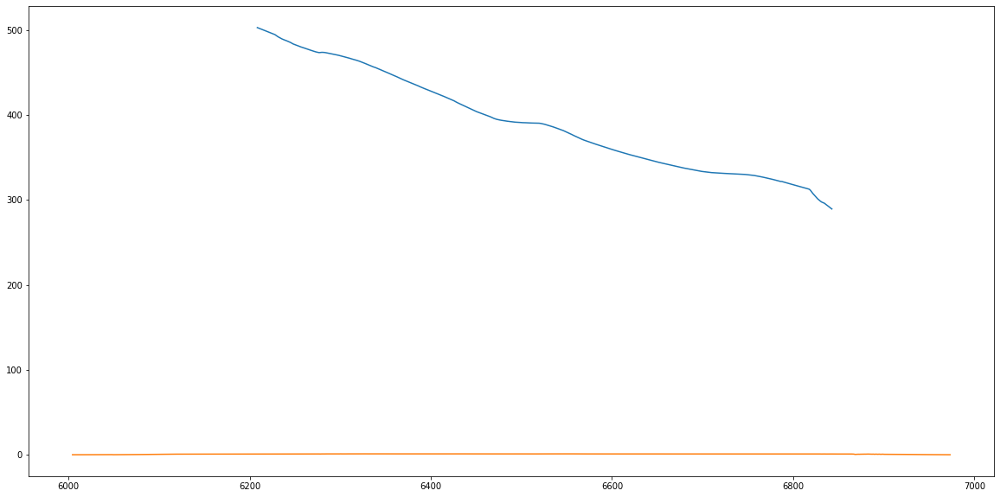

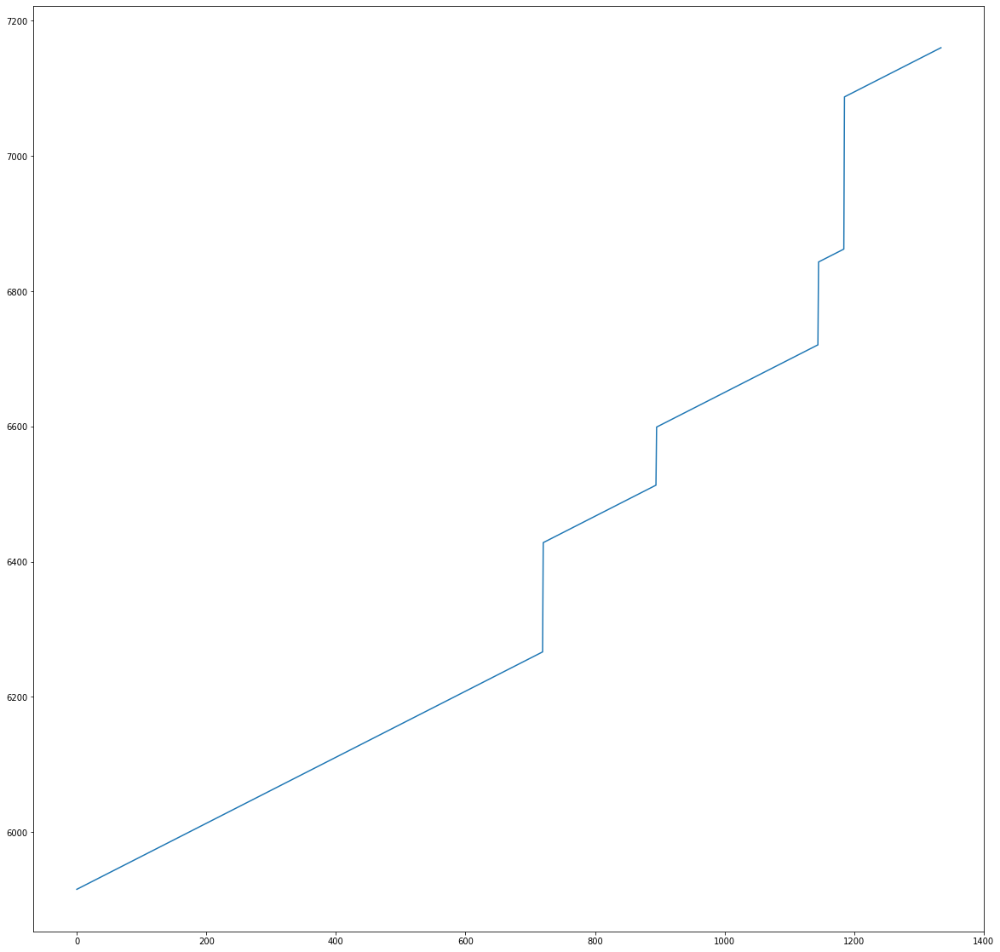

In [33]:
velocity = xpointss[600:1900]
velocityRJ = velocity
#colmean = np.clip(stackRJ, 1.0,1.15).mean(axis=0)
colmean = stackRJ.mean(axis=0)
plt.figure(figsize=(20,10))
plt.plot(velocity,colmean)
plt.plot(wavePTO,sensPTO)
plt.savefig('ContComp.pdf')
JulRVel = velocity
JulRmean = colmean

plt.show()
plt.figure(figsize=(20,20))
plt.plot(xpF)

#6200-6250
#6400-6450
#6640-6680
#6810-6825

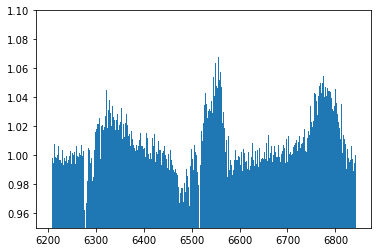

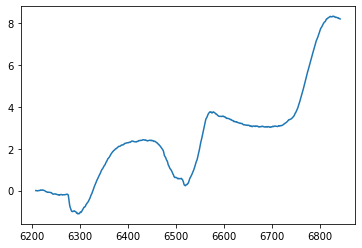

In [40]:

plt.bar(velocity,colmean)
plt.ylim(0.95,1.1)
plt.show()
plt.plot(velocity,np.cumsum(colmean-1))

(6200, 6400)

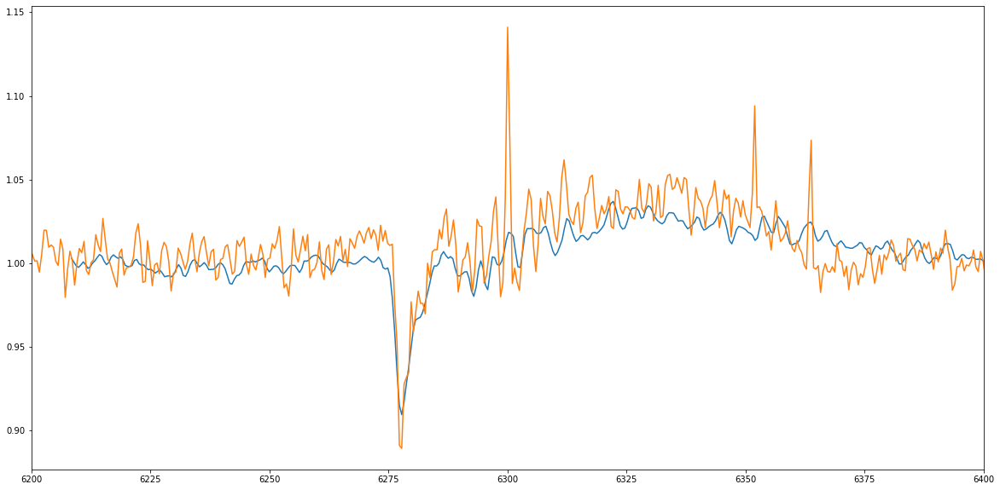

In [9]:
velocity = xpointss[600:1900]
velocityRJ = velocity
#colmean = np.clip(stackRJ, 1.0,1.15).mean(axis=0)
colmean = stackRJ.mean(axis=0)
plt.figure(figsize=(20,10))
plt.plot(velocity,colmean)
plt.plot(wavePTO,sensPTO)
#plt.savefig('ContComp.pdf')
JulRVel = velocity
JulRmean = colmean
plt.xlim(6200,6400)

In [29]:
xpointss[1000]

6403.780662062396

In [34]:
RJXpoints = np.linspace(5525, 7575, 4200)
RJXpoints = RJXpoints[:4100]
xpointss = RJXpoints[800:3350]
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801
popt,pcov = curve_fit(gaus,JulRVel[550:850],JulRmean[550:850],p0=[0.0,wavelToVelR(6550),wavelToStdR(14),-1.01])
RJPiMean = popt[1]
RJPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulRVel[900:],JulRmean[900:],p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1])
RJSPMean = popt[1]
RJSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulRVel[:350],JulRmean[:350],p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
RJSMMean = popt[1]
RJSMErr = np.sqrt(np.diag(pcov))[1]
RJGaussMEansM = []
RJGaussMEansMErr = []
RJGaussMEansMSP = []
RJGaussMEansMErrSP = []
RJGaussMEansMSM = []
RJGaussMEansMErrSM = []
miniCount = 0
timeRJ = np.array(timeRJ)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(400)
fluxstackSM = np.zeros(350)
for i in range(113):
    thisflux = stackRJ[i]
    thisflux = stackRJ[i]
    piComp = thisflux[550:850]
    SPComp = thisflux[900:]
    SMComp = thisflux[:350]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1150:1450]),fluxstack,p0=[0.05,wavelToVelR(6550),wavelToStdR(14),-1.01])
        RJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErr.append(thisstd)
        piDiv = popt[0]
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / (1+piDiv)
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1500:1900]),fluxstackSP,p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1.0])
        RJGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErrSP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / (1+piDiv)
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[600:950]),fluxstackSM,p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6280),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6360),wavelToStdR(40),-0.9]))
        RJGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErrSM.append(thisstd)
        fluxstackSMOld = fluxstackSM
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(len(SPComp))
        fluxstackSM = np.zeros(len(SMComp))

    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1
plt.title(r"H$\alpha$ $\pi$")
plt.errorbar(timeRJ,RJGaussMEansM,yerr=RJGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '')
#plt.ylim(-500,500)
plt.show()
plt.title(r"H$\alpha$ $\sigma+$")
plt.errorbar(timeRJ,RJGaussMEansMSP,yerr=RJGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k', ls = '' )
#plt.ylim(-20,20)
plt.show()
plt.title(r"H$\alpha$ $\sigma-$" )
plt.errorbar(timeRJ,RJGaussMEansMSM,yerr=RJGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
#plt.ylim(-500,500)

plt.show()

D:\conda\lib\site-packages\scipy\optimize\minpack.py:795: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.

(10, 12)

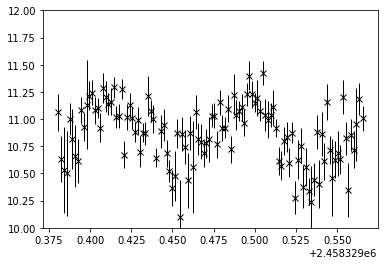

In [27]:
RJErrComb = np.sqrt((np.array(RJGaussMEansMErrSP)**2)+(np.array(RJGaussMEansMErrSM)**2))
RJBEst = (np.array(RJGaussMEansMSP)-np.array(sigMinEst))/39.98
RJErrComb = RJBEst*RJErrComb/(np.array(RJGaussMEansMSP)-np.array(sigMinEst))
plt.errorbar(timeRJ,RJBEst,yerr=RJErrComb,c='k', lw=1, marker='x',ecolor='k', ls = '')
plt.ylim(10,12)
#39.98

(10, 12)

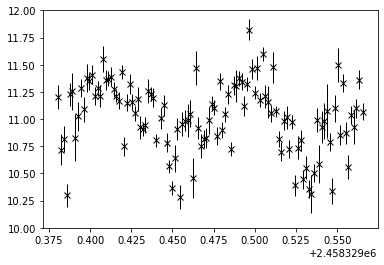

In [30]:
RJErrComb = np.sqrt((np.array(RJGaussMEansMErrSP)**2)+(np.array(RJGaussMEansMErrSM)**2))
RJBEst = (np.array(RJGaussMEansMSP)-np.array(RJGaussMEansMSM))/39.98
RJErrComb = RJBEst*RJErrComb/(np.array(RJGaussMEansMSP)-np.array(RJGaussMEansMSM))
plt.errorbar(timeRJ,RJBEst,yerr=RJErrComb,c='k', lw=1, marker='x',ecolor='k', ls = '')
plt.ylim(10,12)
#39.98

In [31]:
np.save('RJBEst.npy', RJBEst)
np.save('RJBEste.npy', RJErrComb)

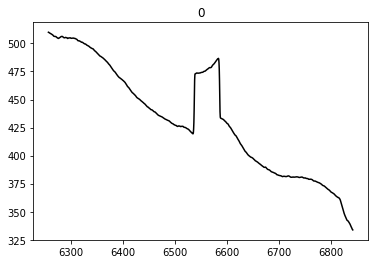

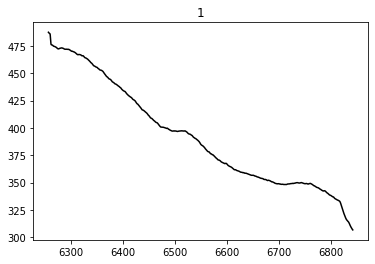

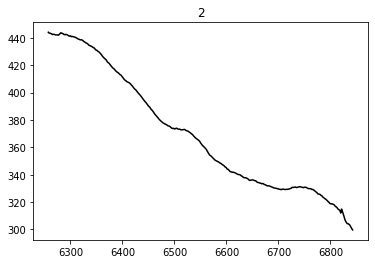

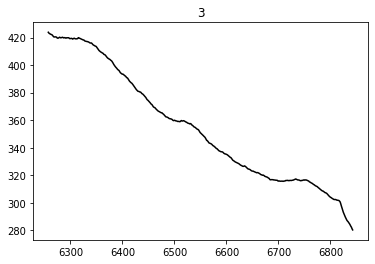

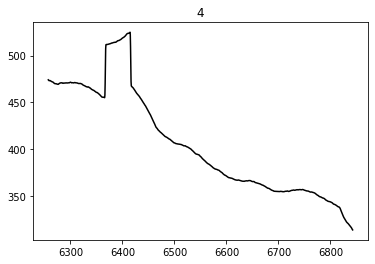

...

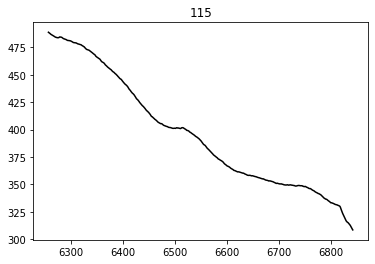

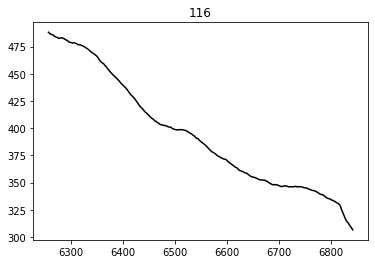

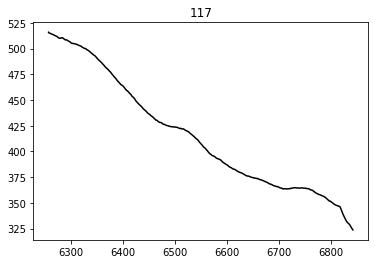

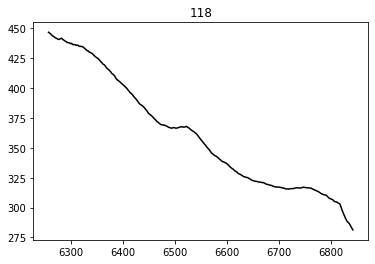

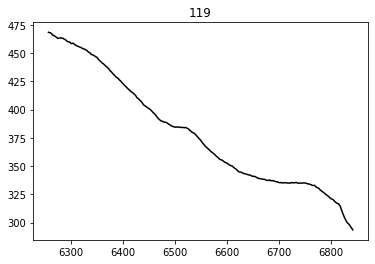

In [38]:
RMXpoints = np.linspace(5525, 7575, 4200)
RMXpoints = RMXpoints[:4100]
xpointss = RMXpoints[800:3350]


testMean = np.zeros(len(xpointss))
xp1 = xpointss[:720]
xp2 = xpointss[1050:1225]
xp3 = xpointss[1400:1650]
xp4 = xpointss[1900:1940]
xp5 = xpointss[2400:2550]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
for i in range(120):
    flux = holder_arrayRM[i]
    if i ==12:
        flux[2395:2410] = np.clip(flux[2395:2410], 0,350)
    if i ==40:
        flux[990:1010]= np.clip(flux[990:1010], 0, 460)
        flux[3645:3670] = np.clip(flux[3645:3670], 0,200)
    if i ==45:
        flux[2310:2335]= np.clip(flux[2310:2335],0,300)
    if i ==65:
        flux[1420:1455] = np.clip(flux[1420:1455], 0,500)
    if i ==69:
        flux[1950:1970] = np.clip(flux[1950:1970],0,400)
    if i == 83:
        flux[1855:1870] = np.clip(flux[1855:1870],0,400)
        flux[2120:2130] = np.clip(flux[2120:2130],0,400)
    flux = flux[:4100]
    flux = flux[800:3350]

    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = flux#/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for count, el in enumerate(fluxNormed):
        if el > 1.15:
            fluxNormed[count] = uniform_filter(fluxNormed,size=200)[count]
        
    fluxNormed = fluxNormed# * f2(xpointss, popt[0], popt[1], popt[2], popt[3],popt[4])
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = fluxNormed#/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for c,el in enumerate(fluxNormed[700:800]):
        if el < 1:
            pass
            #fluxNormed[700+c] = 1
    testMean = testMean + fluxNormed
    #plt.plot(xpointss[700:1900], testMean[700:1900])
    plt.title(str(i))
    plt.plot(xpointss[700:1900], fluxNormed[700:1900], c='k')
    #plt.plot(xpointss[1600:1900], testMean[1600:1900], c='r')
    plt.show()
    if i ==0:
        stack = fluxNormed[700:1900]
    else:
        stack = np.vstack((stack, fluxNormed[700:1900]))
testMean = testMean /120  
stackRM = stack

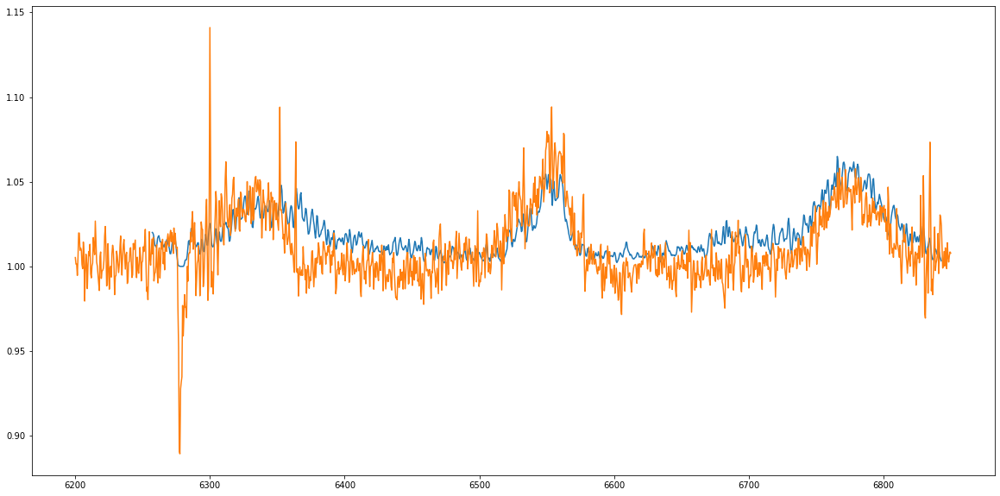

In [10]:
velocity = xpointss[700:1900]
velocityRJ = velocity
colmean = np.clip(stackRM, 1.0,1.15).mean(axis=0)
plt.figure(figsize=(20,10))
plt.plot(velocity,colmean)
plt.plot(wavePTO,sensPTO)
MayRVel = velocity
MayRmean = colmean

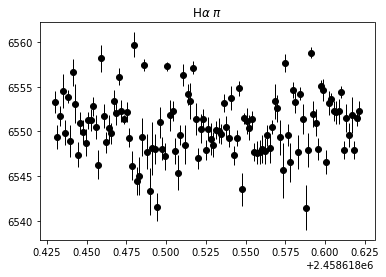

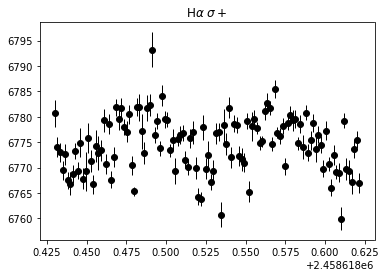

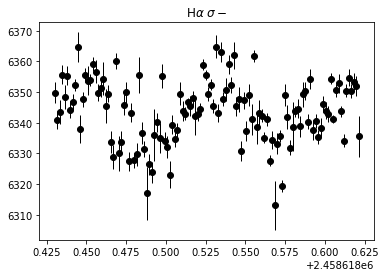

In [34]:
RMXpoints = np.linspace(5525, 7575, 4200)
RMXpoints = RMXpoints[:4100]
xpointss = RMXpoints[800:3350]
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801

popt,pcov = curve_fit(gaus,MayRVel[450:750],MayRmean[450:750],p0=[0.0,wavelToVelR(6550),wavelToStdR(14),-1.01])
RMPiMean = popt[1]
RMPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayRVel[800:],MayRmean[800:],p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1])
RMSPMean = popt[1]
RMSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayRVel[:350],MayRmean[:350],p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
RMSMMean = popt[1]
RMSMErr = np.sqrt(np.diag(pcov))[1]
RMGaussMEansM = []
RMGaussMEansMErr = []
RMGaussMEansMSP = []
RMGaussMEansMErrSP = []
RMGaussMEansMSM = []
RMGaussMEansMErrSM = []
miniCount = 0
timeRM = np.array(timeRM)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(400)
fluxstackSM = np.zeros(350)
for i in range(120):
    thisflux = stackRM[i]
    thisflux = stackRM[i]
    piComp = thisflux[450:750]
    SPComp = thisflux[800:]
    SMComp = thisflux[:350]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1150:1450]),fluxstack,p0=[0.05,wavelToVelR(6550),wavelToStdR(14),-1.01])
        RMGaussMEansM.append(popt[1])
        RMINorm = popt[0]
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / (1+RMINorm) # delet this
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1500:1900]),fluxstackSP,p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1.0])
        RMGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErrSP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / (1+RMINorm) #and this
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[700:1050]),fluxstackSM,p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-0.9]))
        RMGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErrSM.append(thisstd)

        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(len(SPComp))
        fluxstackSM = np.zeros(len(SMComp))

    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1

plt.errorbar(timeRM,RMGaussMEansM,yerr=RMGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\alpha$ $\pi$")
plt.show()
plt.errorbar(timeRM,RMGaussMEansMSP,yerr=RMGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k', ls = '' )
plt.title(r"H$\alpha$ $\sigma+$")
plt.show()
plt.errorbar(timeRM,RMGaussMEansMSM,yerr=RMGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\alpha$ $\sigma-$" )
plt.show()



<ErrorbarContainer object of 3 artists>

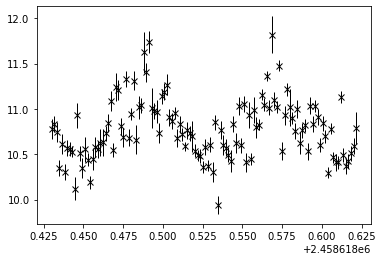

In [35]:
RMErrComb = np.sqrt((np.array(RMGaussMEansMErrSP)**2)+(np.array(RMGaussMEansMErrSM)**2))
RMBEst = (np.array(RMGaussMEansMSP)-np.array(RMGaussMEansMSM))/39.98
RMErrComb = RMBEst*RMErrComb/(np.array(RMGaussMEansMSP)-np.array(RMGaussMEansMSM))
plt.errorbar(timeRM,RMBEst,yerr=RMErrComb,c='k', lw=1, marker='x',ecolor='k', ls = '')
#39.98

In [36]:
np.save('RMBEst.npy', RMBEst)
np.save('RMBEste.npy', RMErrComb)

In [63]:
fff = open("timeBM", "r")
timeBM = []
for x in fff:
    x = float(x)
    timeBM.append(x)
    
fff = open("timeRM", "r")
timeRM = []
for x in fff:
    x = float(x)
    timeRM.append(x)
    
fff = open("timeBJ", "r")
timeBJ = []
for x in fff:
    x = float(x)
    timeBJ.append(x)
    
fff = open("timeRJ", "r")
timeRJ = []
for x in fff:
    x = float(x)
    timeRJ.append(x)
    
BJXpoints = np.linspace(3625, 5460, 4200)
print(BJXpoints[665:3485])

RJXpoints = np.linspace(5525, 7575, 4200)
print(RJXpoints[800:3200])

countGlob = 1
holder_arrayBM = []

path = 'C:/Users/Admin/newMay19/'
consts = []
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayBM = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayBM = np.vstack((holder_arrayBM, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
countGlob = 1
holder_arrayBJ = []

path = 'C:/Users/Admin/newJul18/'
consts = []
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayBJ = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayBJ = np.vstack((holder_arrayBJ, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
        
countGlob = 1
holder_arrayRJ = []

path = 'C:/Users/Admin/re-normedAlpha/newJul/'
consts = []
with open(path+'RJohnNorm') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
  
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            #holder_arrayRJ = gaussian_filter(typeEx, sigma=1)
            holder_arrayRJ = typeEx
        else:
            
            #holder_arrayRJ = np.vstack((holder_arrayRJ, gaussian_filter(typeEx, sigma=1)))
            holder_arrayRJ = np.vstack((holder_arrayRJ, typeEx))
        countGlob = 2

countGlob = 1
holder_arrayRM = []

path = 'C:/Users/Admin/re-normedAlpha/newMay/'
consts = []
with open(path+'RJohnNorm') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayRM = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayRM = np.vstack((holder_arrayRM, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2

[3915.61085973 3916.04786854 3916.48487735 ... 5146.66468207 5147.10169088
 5147.53869969]
[5915.56918314 5916.05739462 5916.5456061  ... 7085.81209812 7086.3003096
 7086.78852108]


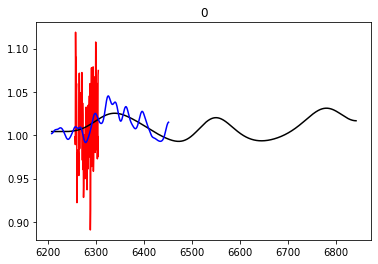

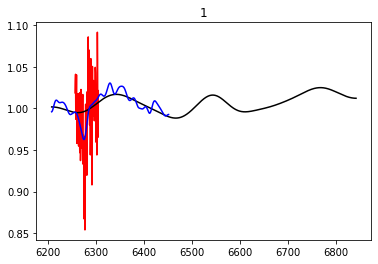

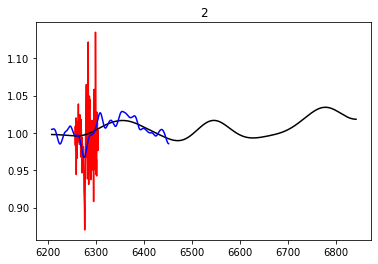

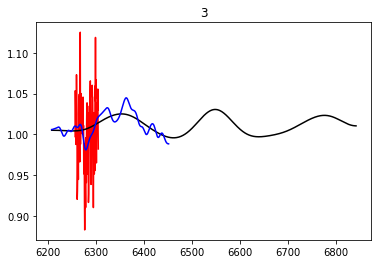

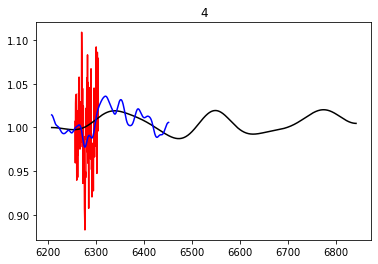

...

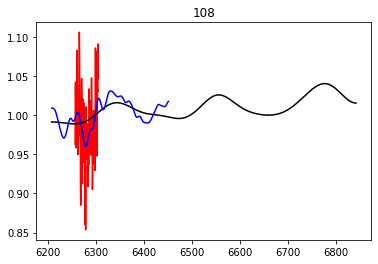

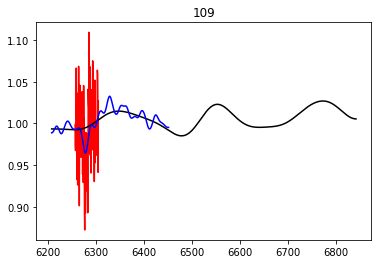

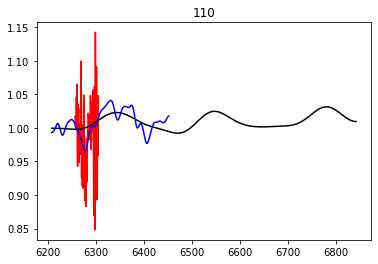

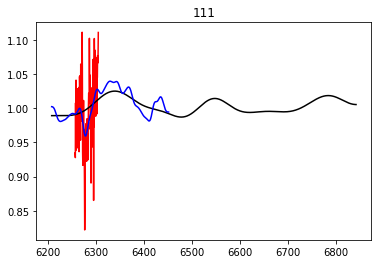

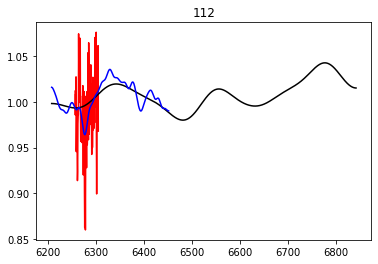

In [40]:
RJXpoints = np.linspace(5525, 7575, 4200)
RJXpoints = RJXpoints[:4100]
xpointss = RJXpoints[800:3350]

testMean = np.zeros(len(xpointss))
sigMinEst = []
xp1 = xpointss[:720]
xp2 = xpointss[1050:1225]
xp3 = xpointss[1400:1650]
xp4 = xpointss[1900:1940]
xp5 = xpointss[2400:2550]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
for i in range(113):
    flux = holder_arrayRJ[i]
    if i ==11:
        flux[2725:2745] = np.median(flux[2700:2725])
    if i ==99:
        flux[1580:1600] = np.clip(flux[1580:1600],0,500)
    if i ==111:
        flux[2250:2300] = np.clip(flux[2250:2300], 0,270)
    if i == 43:
        flux[1900:2100] = np.clip(flux[1900:2100], 0,500)
    if i == 109:
        flux[1100:1200] = np.clip(flux[1100:1200],0,500)
    if i ==42:
        flux[2695:2735] = np.clip(flux[2695:2735],0, 400)
    if i == 18:
        flux[2000:3350] = np.clip(flux[2000:3350],0, 500)
    if i ==105:
        flux[2200:2220] = np.clip(flux[2200:2220], 0,350)
    flux = flux[:4100]
    flux = flux[800:3350]

    if i ==44:
        for c, el1 in enumerate(flux[1000:1150]):
            flux[1000+c] = ((1-c/150)*np.median(flux[950:1000])+(c/150)*np.median(flux[1150:1200]))
    
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = flux#/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for count, el in enumerate(fluxNormed):
        if el > 1.15:
            fluxNormed[count] = uniform_filter(fluxNormed,size=200)[count]
        
    fluxNormed = fluxNormed #* f2(xpointss, popt[0], popt[1], popt[2], popt[3],popt[4])
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = fluxNormed#/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for c,el in enumerate(fluxNormed[700:800]):
        if el < 1:
            #print(c)
            #break
            pass
            #fluxNormed[c] = 1.1
    testMean = testMean + fluxNormed
    plt.title(str(i))
    plt.plot(xpointss[700:800], fluxNormed[700:800], c='r')
    plt.plot(xpointss[600:1900], gaussian_filter(fluxNormed[600:1900],sigma=60), c='k')

    plt.plot(xpointss[600:1100], gaussian_filter(fluxNormed[600:1100],sigma=10), c='b')
    
    
    #plt.plot(xpointss[1600:1900], testMean[1600:1900], c='r')
    plt.show()
    fluxToReplace = gaussian_filter(fluxNormed[600:1900],sigma=60)
    fluxToReplace = straightLine([xpointss[700],xpointss[800]],[fluxToReplace[800],fluxToReplace[700]],xpointss[700:800])
    fluxNormed[700:800] = fluxToReplace
    
    velocity = xpointss[600:1900]
    colmean = fluxNormed[600:1900]
    maxwavel = velocity[85:332][find_nearest(np.cumsum(colmean[85:332]-0.997)/max(np.cumsum(colmean[85:332]-0.997)),0.5)]
    sigMinEst.append(maxwavel)
    
    
    if i ==0:
        stack = fluxNormed[600:1900]
    else:
        stack = np.vstack((stack, fluxNormed[600:1900]))
testMean = testMean/113   
stackRJ = stack

#18

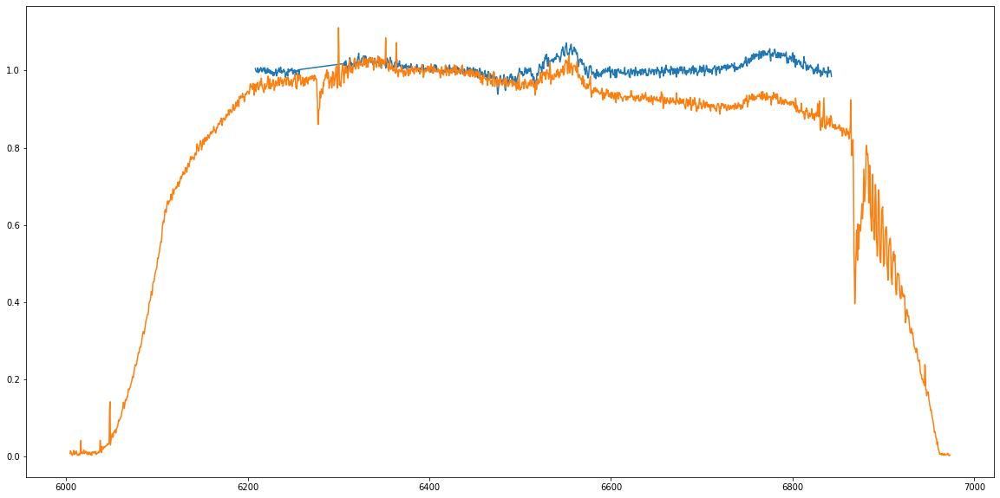

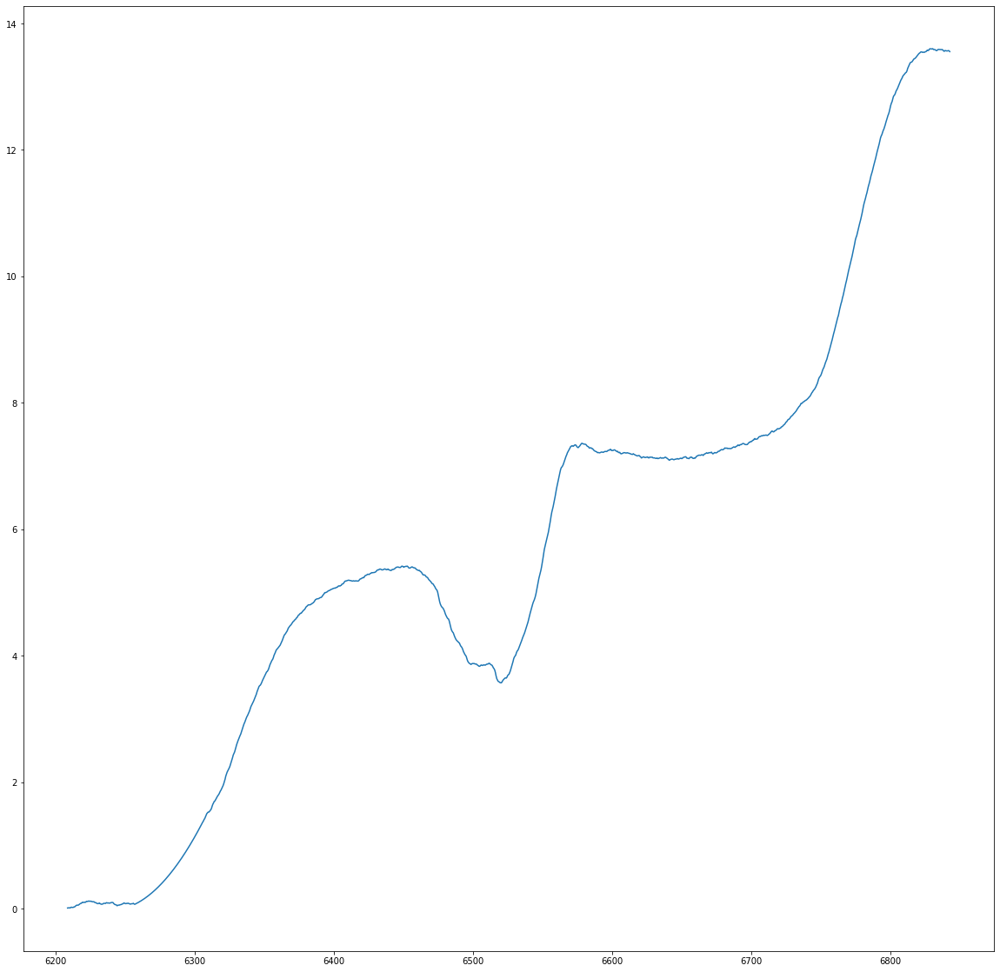

In [41]:
velocity = xpointss[600:1900]
velocityRJ = velocity
#colmean = np.clip(stackRJ, 1.0,1.15).mean(axis=0)
colmean = stackRJ.mean(axis=0)
plt.figure(figsize=(20,10))
plt.plot(velocity,colmean)
plt.plot(wavePTO,sensPTO)
#plt.savefig('ContComp.pdf')
JulRVel = velocity
JulRmean = colmean

plt.show()
plt.figure(figsize=(20,20))
plt.plot(velocity,np.cumsum(colmean-0.997))

#6200-6250
#6400-6450
#6640-6680
#6810-6825

In [90]:
find_nearest(velocity,6370)

331

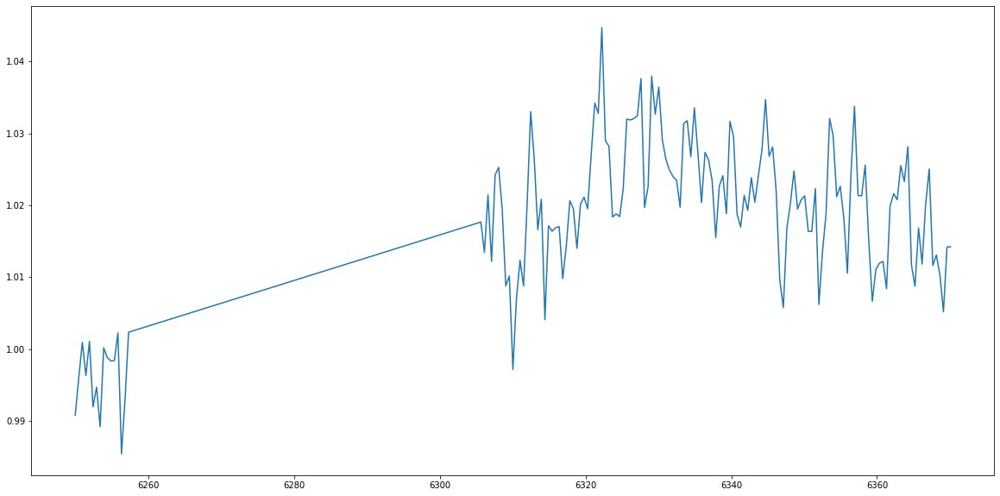

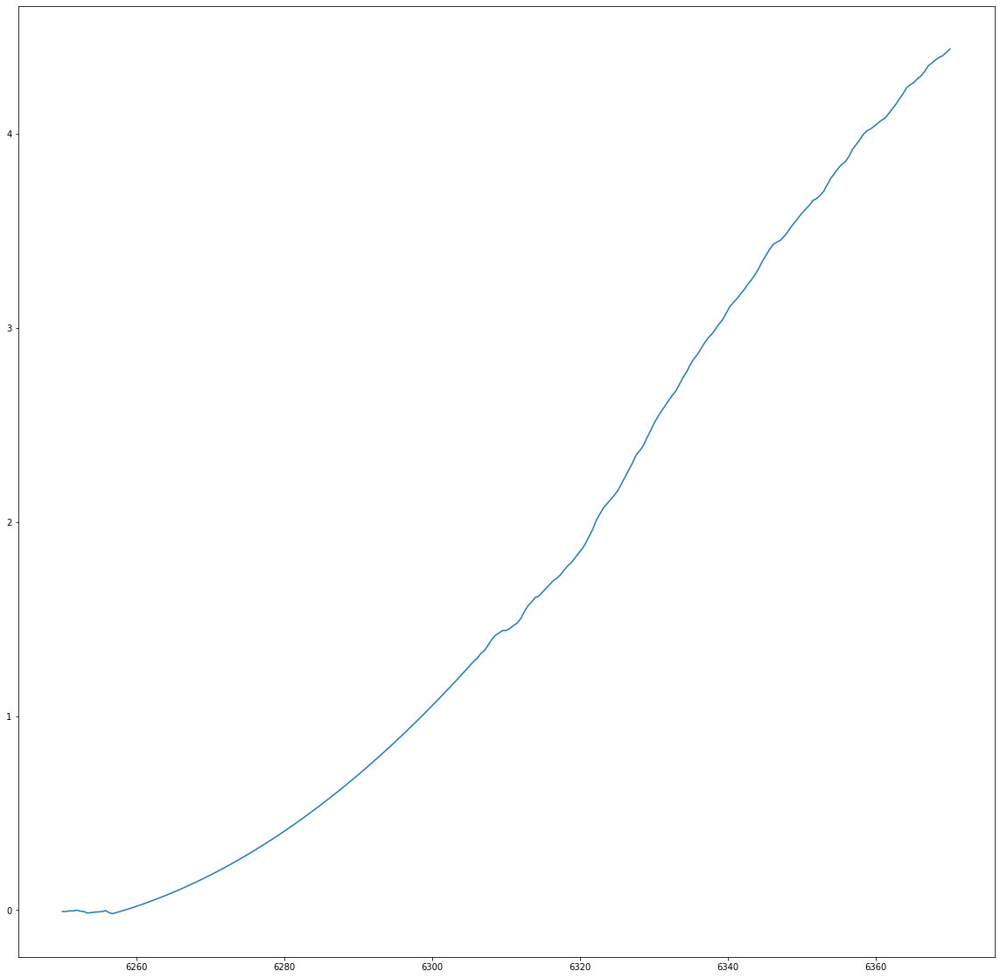

In [91]:
velocity = xpointss[600:1900]
velocityRJ = velocity
#colmean = np.clip(stackRJ, 1.0,1.15).mean(axis=0)
colmean = stackRJ.mean(axis=0)
plt.figure(figsize=(20,10))
plt.plot(velocity[85:332],colmean[85:332])
#plt.plot(wavePTO,sensPTO)
#plt.savefig('ContComp.pdf')
JulRVel = velocity
JulRmean = colmean

plt.show()
plt.figure(figsize=(20,20))
plt.plot(velocity[85:332],np.cumsum(colmean[85:332]-0.997))

#6200-6250
#6400-6450
#6640-6680
#6810-6825

In [92]:
velocity[85:332][find_nearest(np.cumsum(colmean[85:332]-0.997)/max(np.cumsum(colmean[85:332]-0.997)),0.5)]

6326.155036913551

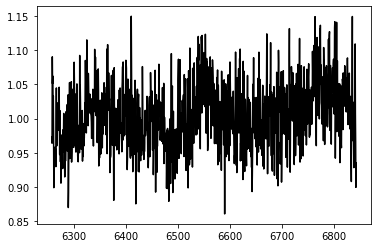

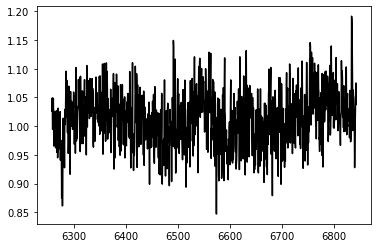

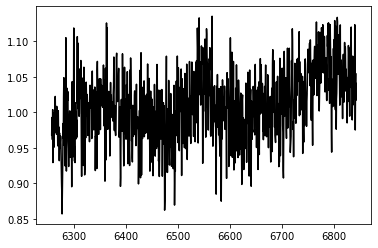

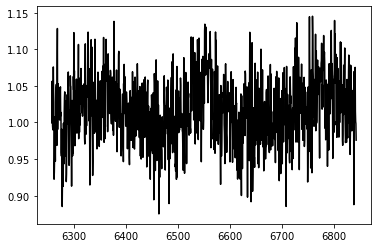

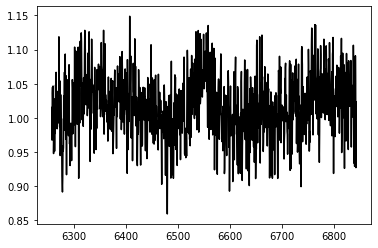

...

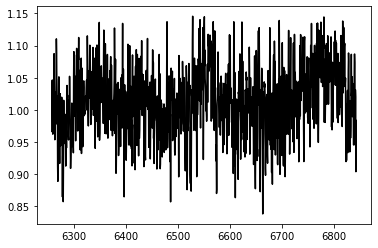

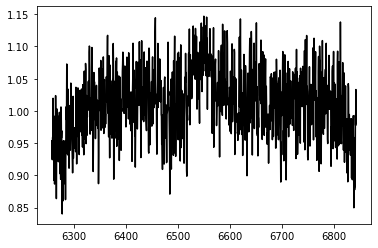

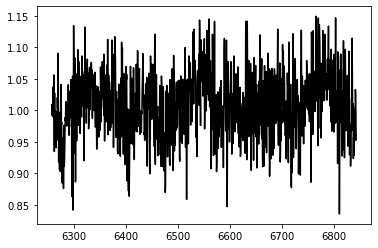

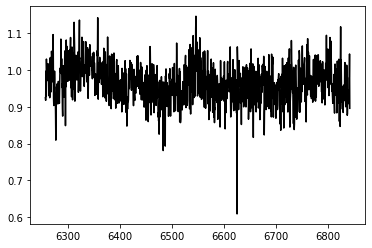

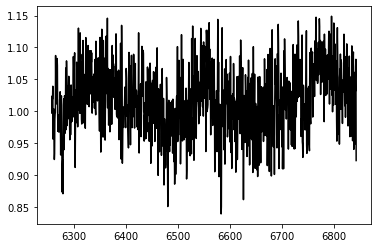

In [76]:
RJXpoints = np.linspace(5525, 7575, 4200)
RJXpoints = RJXpoints[:4100]
xpointss = RJXpoints[800:3350]

testMean = np.zeros(len(xpointss))

xp1 = xpointss[:720]
xp2 = xpointss[1050:1225]
xp3 = xpointss[1400:1650]
xp4 = xpointss[1900:1940]
xp5 = xpointss[2400:2550]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
for i in range(113):
    flux = holder_arrayRJ[i]
    if i ==11:
        flux[2725:2745] = np.median(flux[2700:2725])
    if i ==99:
        flux[1580:1600] = np.clip(flux[1580:1600],0,500)
    if i ==111:
        flux[2250:2300] = np.clip(flux[2250:2300], 0,270)
    if i == 43:
        flux[1900:2100] = np.clip(flux[1900:2100], 0,500)
    if i == 109:
        flux[1100:1200] = np.clip(flux[1100:1200],0,500)
    if i ==42:
        flux[2695:2735] = np.clip(flux[2695:2735],0, 400)
    if i == 18:
        flux[2000:3350] = np.clip(flux[2000:3350],0, 500)
    if i ==105:
        flux[2200:2220] = np.clip(flux[2200:2220], 0,350)
    flux = flux[:4100]
    flux = flux[800:3350]
    if i ==44:
        for c, el1 in enumerate(flux[1000:1150]):
            flux[1000+c] = ((1-c/150)*np.median(flux[950:1000])+(c/150)*np.median(flux[1150:1200]))
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = flux/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for count, el in enumerate(fluxNormed):
        if el > 1.15:
            fluxNormed[count] = uniform_filter(fluxNormed,size=200)[count]
        
    fluxNormed = fluxNormed * f2(xpointss, popt[0], popt[1], popt[2], popt[3],popt[4])
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = fluxNormed/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    testMean = testMean + fluxNormed
    plt.plot(xpointss[700:1900], fluxNormed[700:1900], c='k')
    #plt.plot(xpointss[1600:1900], testMean[1600:1900], c='r')
    plt.show()
    if i ==0:
        stack = fluxNormed[600:1900]
    else:
        stack = np.vstack((stack, fluxNormed[600:1900]))
testMean = testMean/113   
stackRJ = stack

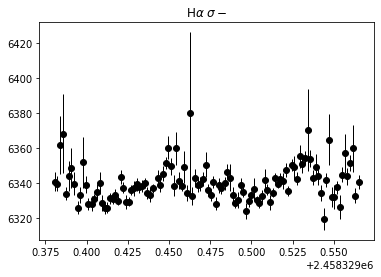

In [77]:
RJXpoints = np.linspace(5525, 7575, 4200)
RJXpoints = RJXpoints[:4100]
xpointss = RJXpoints[800:3350]
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801
popt,pcov = curve_fit(gaus,JulRVel[550:850],JulRmean[550:850],p0=[0.0,wavelToVelR(6550),wavelToStdR(14),-1.01])
RJPiMean = popt[1]
RJPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulRVel[900:],JulRmean[900:],p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1])
RJSPMean = popt[1]
RJSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulRVel[:350],JulRmean[:350],p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
RJSMMean = popt[1]
RJSMErr = np.sqrt(np.diag(pcov))[1]
RJGaussMEansM = []
RJGaussMEansMErr = []
RJGaussMEansMSP = []
RJGaussMEansMErrSP = []
RJGaussMEansMSM = []
RJGaussMEansMErrSM = []
miniCount = 0
timeRJ = np.array(timeRJ)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(400)
fluxstackSM = np.zeros(350)
for i in range(113):
    thisflux = stackRJ[i]
    thisflux = stackRJ[i]
    piComp = thisflux[550:850]
    SPComp = thisflux[900:]
    SMComp = thisflux[:350]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1


        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / (1+piDiv)
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[600:950]),fluxstackSM,p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6280),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6380),wavelToStdR(40),-0.9]))
        RJGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErrSM.append(thisstd)
        fluxstackSMOld = fluxstackSM
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(len(SPComp))
        fluxstackSM = np.zeros(len(SMComp))

    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1
#plt.title(r"H$\alpha$ $\pi$")
#plt.errorbar(timeRJ,RJGaussMEansM,yerr=RJGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '')
#plt.ylim(-500,500)
#plt.show()

plt.title(r"H$\alpha$ $\sigma-$" )
plt.errorbar(timeRJ,RJGaussMEansMSM,yerr=RJGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
#plt.ylim(-500,500)

plt.show()

In [78]:
np.save('RJCentWavel.npy', RJGaussMEansMSM)
np.save('RJCentWavele.npy', RJGaussMEansMErrSM)

(10, 12)

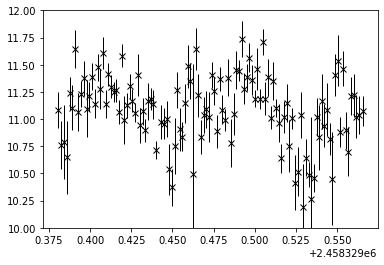

In [94]:
RJErrComb = np.sqrt((np.array(RJGaussMEansMErrSP)**2)+(np.array(RJGaussMEansMErrSM)**2))
RJBEst = (np.array(RJGaussMEansMSP)-np.array(RJGaussMEansMSM))/39.98
RJErrComb = RJBEst*RJErrComb/(np.array(RJGaussMEansMSP)-np.array(RJGaussMEansMSM))
plt.errorbar(timeRJ,RJBEst,yerr=RJErrComb,c='k', lw=1, marker='x',ecolor='k', ls = '')
plt.ylim(10,12)
#39.98

(10, 12)

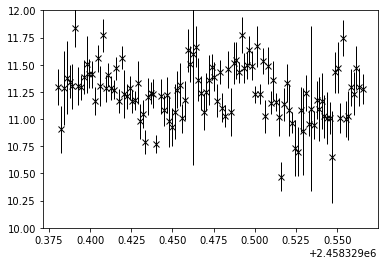

In [99]:
RJErrComb = np.sqrt((np.array(RJGaussMEansMErrSP)**2)+(np.array(RJGaussMEansMErrSM)**2))
RJBEst = (np.array(RJGaussMEansMSP)-np.array(sigMinEst))/39.98
RJErrComb = RJBEst*RJErrComb/(np.array(RJGaussMEansMSP)-np.array(sigMinEst))
plt.errorbar(timeRJ,RJBEst,yerr=RJErrComb,c='k', lw=1, marker='x',ecolor='k', ls = '')
plt.ylim(10,12)
#39.98

In [100]:
np.save('RJBEst.npy', RJBEst)
np.save('RJBEste.npy', RJErrComb)

In [69]:
fff = open("timeBM", "r")
timeBM = []
for x in fff:
    x = float(x)
    timeBM.append(x)
    
fff = open("timeRM", "r")
timeRM = []
for x in fff:
    x = float(x)
    timeRM.append(x)
    
fff = open("timeBJ", "r")
timeBJ = []
for x in fff:
    x = float(x)
    timeBJ.append(x)
    
fff = open("timeRJ", "r")
timeRJ = []
for x in fff:
    x = float(x)
    timeRJ.append(x)
    
BJXpoints = np.linspace(3625, 5460, 4200)
print(BJXpoints[665:3485])

RJXpoints = np.linspace(5525, 7575, 4200)
print(RJXpoints[800:3200])

countGlob = 1
holder_arrayBM = []

path = 'C:/Users/Admin/newMay19/'
consts = []
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayBM = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayBM = np.vstack((holder_arrayBM, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
countGlob = 1
holder_arrayBJ = []

path = 'C:/Users/Admin/newJul18/'
consts = []
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayBJ = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayBJ = np.vstack((holder_arrayBJ, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
        
countGlob = 1
holder_arrayRJ = []

path = 'C:/Users/Admin/re-normedAlpha/newJul/'
consts = []
with open(path+'RJohnNorm') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
  
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            #holder_arrayRJ = gaussian_filter(typeEx, sigma=1)
            holder_arrayRJ = typeEx
        else:
            
            #holder_arrayRJ = np.vstack((holder_arrayRJ, gaussian_filter(typeEx, sigma=1)))
            holder_arrayRJ = np.vstack((holder_arrayRJ, typeEx))
        countGlob = 2

countGlob = 1
holder_arrayRM = []

path = 'C:/Users/Admin/re-normedAlpha/newMay/'
consts = []
with open(path+'RJohnNorm') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayRM = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayRM = np.vstack((holder_arrayRM, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2

[3915.61085973 3916.04786854 3916.48487735 ... 5146.66468207 5147.10169088
 5147.53869969]
[5915.56918314 5916.05739462 5916.5456061  ... 7085.81209812 7086.3003096
 7086.78852108]


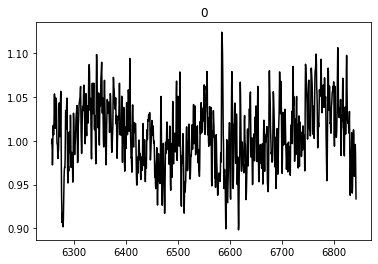

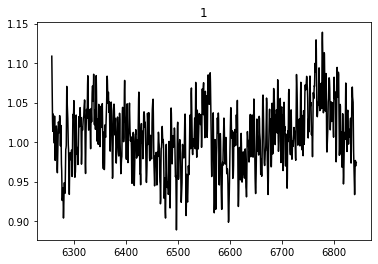

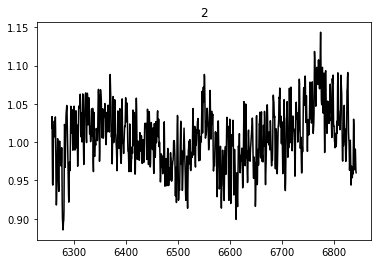

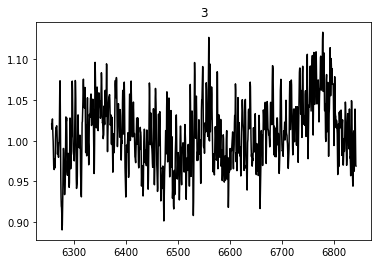

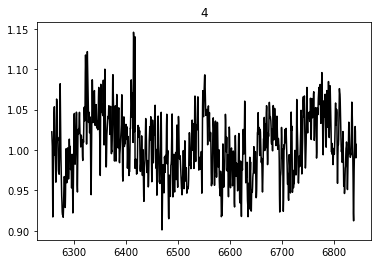

...

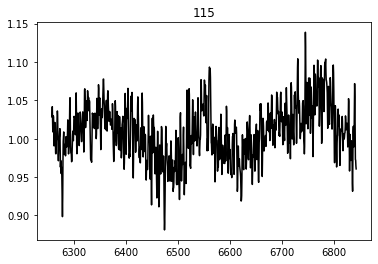

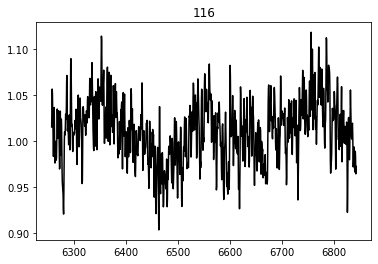

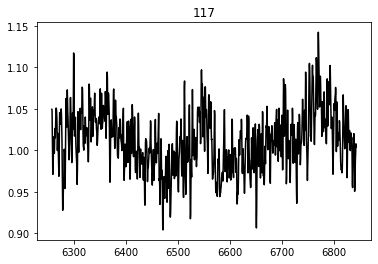

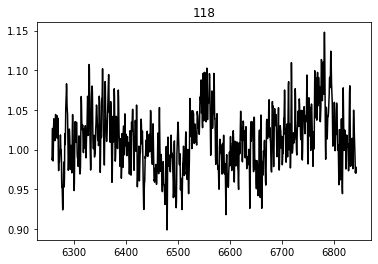

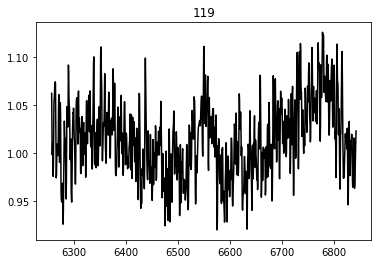

In [50]:
RMXpoints = np.linspace(5525, 7575, 4200)
RMXpoints = RMXpoints[:4100]
xpointss = RMXpoints[800:3350]

sigMinEst = []
testMean = np.zeros(len(xpointss))
xp1 = xpointss[:720]
xp2 = xpointss[1050:1225]
xp3 = xpointss[1400:1650]
xp4 = xpointss[1900:1940]
xp5 = xpointss[2400:2550]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
for i in range(120):
    flux = holder_arrayRM[i]
    if i ==12:
        flux[2395:2410] = np.clip(flux[2395:2410], 0,350)
    if i ==40:
        flux[990:1010]= np.clip(flux[990:1010], 0, 460)
        flux[3645:3670] = np.clip(flux[3645:3670], 0,200)
    if i ==45:
        flux[2310:2335]= np.clip(flux[2310:2335],0,300)
    if i ==65:
        flux[1420:1455] = np.clip(flux[1420:1455], 0,500)
    if i ==69:
        flux[1950:1970] = np.clip(flux[1950:1970],0,400)
    if i == 83:
        flux[1855:1870] = np.clip(flux[1855:1870],0,400)
        flux[2120:2130] = np.clip(flux[2120:2130],0,400)
    flux = flux[:4100]
    flux = flux[800:3350]

    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = flux#/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for count, el in enumerate(fluxNormed):
        if el > 1.15:
            fluxNormed[count] = uniform_filter(fluxNormed,size=200)[count]
        
    fluxNormed = fluxNormed# * f2(xpointss, popt[0], popt[1], popt[2], popt[3],popt[4])
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = fluxNormed#/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for c,el in enumerate(fluxNormed[700:800]):
        if el < 1:
            pass
            #fluxNormed[700+c] = 1
    testMean = testMean + fluxNormed
    #plt.plot(xpointss[700:1900], testMean[700:1900])
    plt.title(str(i))
    plt.plot(xpointss[700:1900], fluxNormed[700:1900], c='k')
    #plt.plot(xpointss[1600:1900], testMean[1600:1900], c='r')
    plt.show()
    fluxToReplace = gaussian_filter(fluxNormed[600:1900],sigma=60)
    fluxToReplace = straightLine([xpointss[700],xpointss[800]],[fluxToReplace[800],fluxToReplace[700]],xpointss[700:800])
    fluxNormed[700:800] = fluxToReplace+0.02
    
    velocity = xpointss[600:1900]
    colmean = fluxNormed[600:1900]
    maxwavel = velocity[85:332][find_nearest(np.cumsum(colmean[85:332]-0.997)/max(np.cumsum(colmean[85:332]-0.997)),0.5)]
    sigMinEst.append(maxwavel)
    
    
    
    if i ==0:
        stack = fluxNormed[600:1900]
    else:
        stack = np.vstack((stack, fluxNormed[600:1900]))
testMean = testMean /120  
stackRM = stack

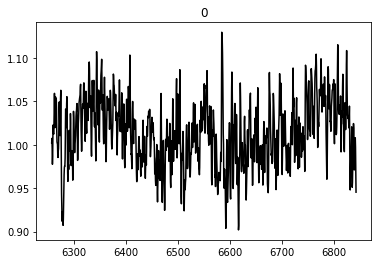

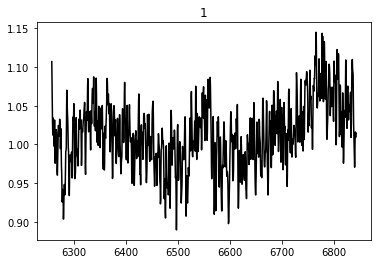

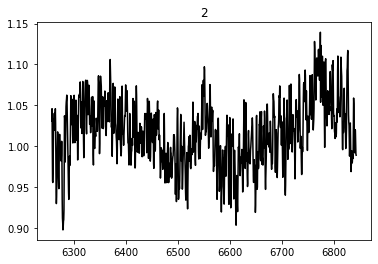

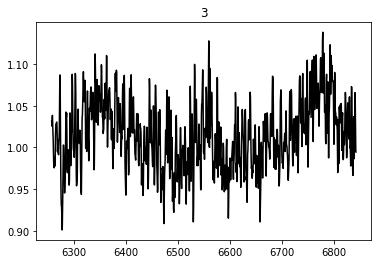

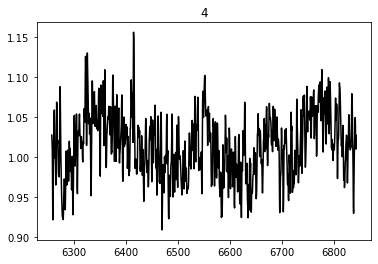

...

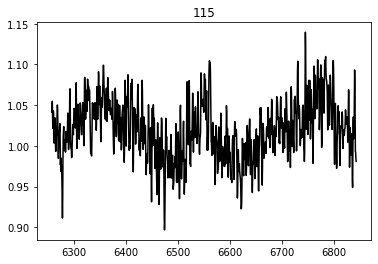

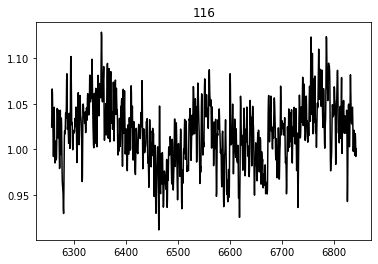

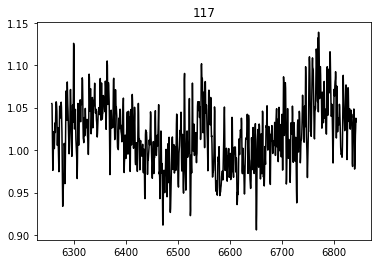

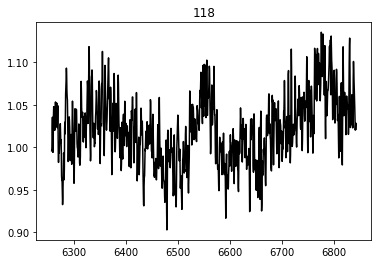

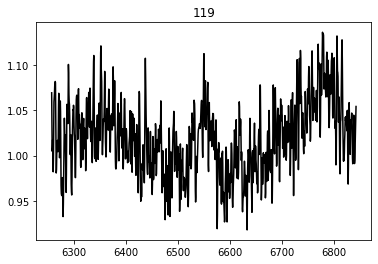

In [72]:
RMXpoints = np.linspace(5525, 7575, 4200)
RMXpoints = RMXpoints[:4100]
xpointss = RMXpoints[800:3350]


testMean = np.zeros(len(xpointss))
xp1 = xpointss[:720]
xp2 = xpointss[1050:1225]
xp3 = xpointss[1400:1650]
xp4 = xpointss[1900:1940]
xp5 = xpointss[2400:2550]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
for i in range(120):
    flux = holder_arrayRM[i]
    if i ==12:
        flux[2395:2410] = np.clip(flux[2395:2410], 0,350)
    if i ==40:
        flux[990:1010]= np.clip(flux[990:1010], 0, 460)
        flux[3645:3670] = np.clip(flux[3645:3670], 0,200)
    if i ==45:
        flux[2310:2335]= np.clip(flux[2310:2335],0,300)
    if i ==65:
        flux[1420:1455] = np.clip(flux[1420:1455], 0,500)
    if i ==69:
        flux[1950:1970] = np.clip(flux[1950:1970],0,400)
    if i == 83:
        flux[1855:1870] = np.clip(flux[1855:1870],0,400)
        flux[2120:2130] = np.clip(flux[2120:2130],0,400)
    flux = flux[:4100]
    flux = flux[800:3350]

    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = flux/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for count, el in enumerate(fluxNormed):
        if el > 1.15:
            fluxNormed[count] = uniform_filter(fluxNormed,size=200)[count]
        
    fluxNormed = fluxNormed * f2(xpointss, popt[0], popt[1], popt[2], popt[3],popt[4])
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = fluxNormed/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    testMean = testMean + fluxNormed
    #plt.plot(xpointss[700:1900], testMean[700:1900])
    plt.title(str(i))
    plt.plot(xpointss[700:1900], fluxNormed[700:1900], c='k')
    #plt.plot(xpointss[1600:1900], testMean[1600:1900], c='r')
    plt.show()
    if i ==0:
        stack = fluxNormed[600:1900]
    else:
        stack = np.vstack((stack, fluxNormed[600:1900]))
testMean = testMean /120  
stackRM = stack

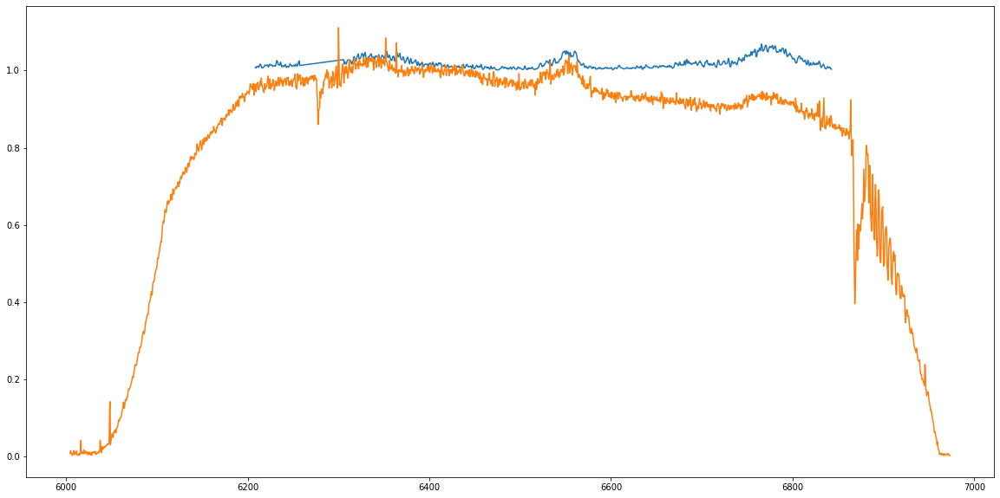

In [51]:
velocity = xpointss[600:1900]
velocityRJ = velocity
colmean = np.clip(stackRM, 1.0,1.15).mean(axis=0)
plt.figure(figsize=(20,10))
plt.plot(velocity,colmean)
plt.plot(wavePTO,sensPTO)
MayRVel = velocity
MayRmean = colmean

In [52]:
len(sigMinEst)

120

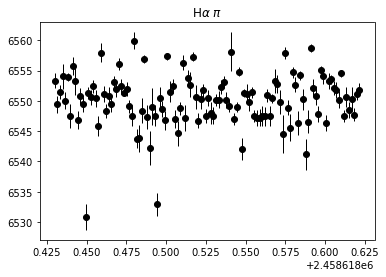

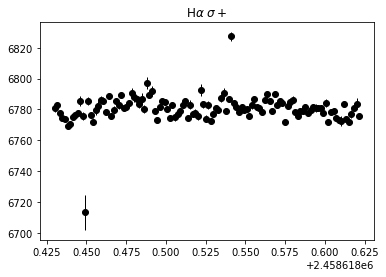

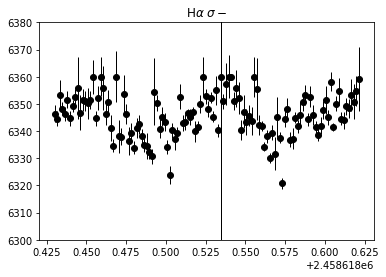

In [74]:
RMXpoints = np.linspace(5525, 7575, 4200)
RMXpoints = RMXpoints[:4100]
xpointss = RMXpoints[800:3350]
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801

popt,pcov = curve_fit(gaus,MayRVel[550:850],MayRmean[550:850],p0=[0.0,wavelToVelR(6550),wavelToStdR(14),-1.01])
RMPiMean = popt[1]
RMPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayRVel[900:],MayRmean[900:],p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1])
RMSPMean = popt[1]
RMSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayRVel[:350],MayRmean[:350],p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
RMSMMean = popt[1]
RMSMErr = np.sqrt(np.diag(pcov))[1]
RMGaussMEansM = []
RMGaussMEansMErr = []
RMGaussMEansMSP = []
RMGaussMEansMErrSP = []
RMGaussMEansMSM = []
RMGaussMEansMErrSM = []
miniCount = 0
timeRM = np.array(timeRM)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(400)
fluxstackSM = np.zeros(350)
for i in range(120):
    thisflux = stackRM[i]
    thisflux = stackRM[i]
    piComp = thisflux[550:850]
    SPComp = thisflux[900:]
    SMComp = thisflux[:350]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1150:1450]),fluxstack,p0=[0.05,wavelToVelR(6550),wavelToStdR(14),-1.01])
        RMGaussMEansM.append(popt[1])
        RMINorm = popt[0]
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / (1+RMINorm) # delet this
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1500:1900]),fluxstackSP,p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1.0])
        RMGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErrSP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / (1+RMINorm) #and this
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[600:950]),fluxstackSM,p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6280),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6360),wavelToStdR(40),-0.9]))        
        RMGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErrSM.append(thisstd)

        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(len(SPComp))
        fluxstackSM = np.zeros(len(SMComp))

    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1

plt.errorbar(timeRM,RMGaussMEansM,yerr=RMGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\alpha$ $\pi$")
plt.show()
plt.errorbar(timeRM,RMGaussMEansMSP,yerr=RMGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k', ls = '' )
plt.title(r"H$\alpha$ $\sigma+$")
plt.show()
plt.errorbar(timeRM,RMGaussMEansMSM,yerr=RMGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\alpha$ $\sigma-$" )
plt.ylim(6300,6380)
plt.show()



In [75]:
np.save('RMCentWavel.npy', RMGaussMEansMSM)
np.save('RMCentWavele.npy', RMGaussMEansMErrSM)

<ErrorbarContainer object of 3 artists>

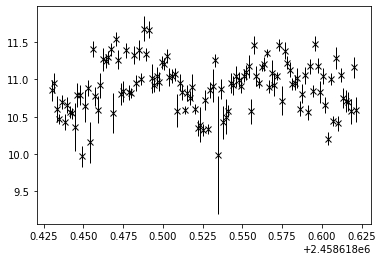

In [135]:
RMErrComb = np.sqrt((np.array(RMGaussMEansMErrSP)**2)+(np.array(RMGaussMEansMErrSM)**2))
RMBEst = (np.array(RMGaussMEansMSP)-np.array(RMGaussMEansMSM))/39.98
RMErrComb = RMBEst*RMErrComb/(np.array(RMGaussMEansMSP)-np.array(RMGaussMEansMSM))
plt.errorbar(timeRM,RMBEst,yerr=RMErrComb,c='k', lw=1, marker='x',ecolor='k', ls = '')
#39.98

<ErrorbarContainer object of 3 artists>

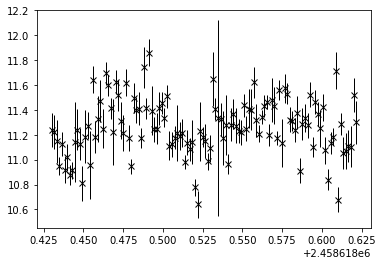

In [136]:
RMErrComb = np.sqrt((np.array(RMGaussMEansMErrSP)**2)+(np.array(RMGaussMEansMErrSM)**2))
RMBEst = (np.array(RMGaussMEansMSP)-np.array(sigMinEst))/39.98
RMErrComb = RMBEst*RMErrComb/(np.array(RMGaussMEansMSP)-np.array(sigMinEst))
plt.errorbar(timeRM,RMBEst,yerr=RMErrComb,c='k', lw=1, marker='x',ecolor='k', ls = '')
#39.98

In [137]:
np.save('RMBEst.npy', RMBEst)
np.save('RMBEste.npy', RMErrComb)